# BLOG ON "INSURANCE CLAIMS - FRAUD DETECTION"

# INTRODUCTION

An Insurance claim is a simple type of request made to our policy provider. A claim is made after an incident occurs that's covered by the policy. Payment from claim is usually used to replace or repair property or pay for health care costs related to an injury. Let's take a example If you have collision car insurance and get into an accident with another driver, you'll want to file a claim with your car insurance company to cover(or reimburse) the costs that stem from the accident so that you don't have to pay out of pocket.

And then, when we talk about the fraud detection of insurance claim is very scarier. Insurance fraud detection is a challenging problem, given the variety of fraud patterns and relatively small ratio of known frauds in typical smaples. While building detection models, the savings from loss prevention needs to be balanced with cost of false alerts. It cover the range of improper activities which an individual may commit in order to achieve a favourable outcome from the insurance company. 

Here is the tip: Due to complex nature of claims, it's easy for both parties to misunderstand each other. You need information from them, and they need it from you. However, it doesn't always flow the way it should. Help yourself by keeping records.

# TABLE OF CONTENTS

+ Problem Statement
+ Data Analysis
+ Useful Information from Data
+ EDA Concluding Remark
+ Pre-Processing 
+ Building Machine Learning Models
+ Concluding Remarks

# Problem Statement

+ Business case:

Insurance fraud is a huge problem in the industry. It's difficult to identify fraud claims. Machine Learning is in a unique position to help the Auto Insurance industry with this problem. In this project, you are provided a dataset which has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made. In this example, you will be working with some auto insurance data to demonstrate how you can create a predictive model that predicts if an insurance claim is fraudulent or not. 

+ Note: Use the link below to reach to your dataset. 

# Data Analysis

Let's talk about data analysis. For analysis we need data. So, its all about the process of importing libraries, data cleaning , transforming, inspecting and modelling data iwth the goal of discovering useful information to conclude at last.

# + Importing libraries
 
Lets import all the important libraries which can help for further complete information

In [1]:
# importing libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import lightgbm as lgb
import sklearn

from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from matplotlib import cm
from sklearn.metrics import silhouette_samples
from sklearn.metrics import silhouette_score
from sklearn.metrics import accuracy_score

from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn import svm

from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics
from sklearn.metrics import confusion_matrix,classification_report
from sklearn.svm import SVR


import warnings
warnings.filterwarnings('ignore')

# + Read Data
 
 For reading the data, use pandas read_csv() function. It will take the path of the file as a string.

In [2]:
df=pd.read_csv(r'C:/Users/user/Desktop/DT Python/Data-Science-ML-Capstone-Projects-master/Automobile_insurance_fraud.csv')
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


# Useful Information from data

In [3]:
df.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day 

df.describe(include='all')

for broad statistics about the dataset like count, max, min, standard deviation, mean and median then go for the pandas describe() function.

In [4]:
df.describe(include='all')

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
count,1000.000000,1000.000000,1000.000000,1000,1000,1000,1000.000000,1000.000000,1.000000e+03,1000.000000,...,1000,1000.00000,1000.000000,1000.000000,1000.000000,1000,1000,1000.000000,1000,0.0
unique,NaN,NaN,NaN,951,3,3,NaN,NaN,NaN,NaN,...,3,NaN,NaN,NaN,NaN,14,39,NaN,2,NaN
top,NaN,NaN,NaN,01-01-2006,OH,250/500,NaN,NaN,NaN,NaN,...,?,NaN,NaN,NaN,NaN,Saab,RAM,NaN,N,NaN
freq,NaN,NaN,NaN,3,352,351,NaN,NaN,NaN,NaN,...,343,NaN,NaN,NaN,NaN,80,43,NaN,753,NaN
mean,203.954000,38.948000,546238.648000,NaN,NaN,NaN,1136.000000,1256.406150,1.101000e+06,501214.488000,...,NaN,52761.94000,7433.420000,7399.570000,37928.950000,NaN,NaN,2005.103000,NaN,NaN
std,115.113174,9.140287,257063.005276,NaN,NaN,NaN,611.864673,244.167395,2.297407e+06,71701.610941,...,NaN,26401.53319,4880.951853,4824.726179,18886.252893,NaN,NaN,6.015861,NaN,NaN
min,0.000000,19.000000,100804.000000,NaN,NaN,NaN,500.000000,433.330000,-1.000000e+06,430104.000000,...,NaN,100.00000,0.000000,0.000000,70.000000,NaN,NaN,1995.000000,NaN,NaN
25%,115.750000,32.000000,335980.250000,NaN,NaN,NaN,500.000000,1089.607500,0.000000e+00,448404.500000,...,NaN,41812.50000,4295.000000,4445.000000,30292.500000,NaN,NaN,2000.000000,NaN,NaN
50%,199.500000,38.000000,533135.000000,NaN,NaN,NaN,1000.000000,1257.200000,0.000000e+00,466445.500000,...,NaN,58055.00000,6775.000000,6750.000000,42100.000000,NaN,NaN,2005.000000,NaN,NaN
75%,276.250000,44.000000,759099.750000,NaN,NaN,NaN,2000.000000,1415.695000,0.000000e+00,603251.000000,...,NaN,70592.50000,11305.000000,10885.000000,50822.500000,NaN,NaN,2010.000000,NaN,NaN


In [5]:
df.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

In [6]:
df.iterrows

<bound method DataFrame.iterrows of      months_as_customer  age  policy_number policy_bind_date policy_state  \
0                   328   48         521585       17-10-2014           OH   
1                   228   42         342868       27-06-2006           IN   
2                   134   29         687698       06-09-2000           OH   
3                   256   41         227811       25-05-1990           IL   
4                   228   44         367455       06-06-2014           IL   
..                  ...  ...            ...              ...          ...   
995                   3   38         941851       16-07-1991           OH   
996                 285   41         186934       05-01-2014           IL   
997                 130   34         918516       17-02-2003           OH   
998                 458   62         533940       18-11-2011           IL   
999                 456   60         556080       11-11-1996           OH   

    policy_csl  policy_deductable  poli

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

In [8]:
df.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

In [9]:
df.nunique()

months_as_customer              391
age                              46
policy_number                  1000
policy_bind_date                951
policy_state                      3
policy_csl                        3
policy_deductable                 3
policy_annual_premium           991
umbrella_limit                   11
insured_zip                     995
insured_sex                       2
insured_education_level           7
insured_occupation               14
insured_hobbies                  20
insured_relationship              6
capital-gains                   338
capital-loss                    354
incident_date                    60
incident_type                     4
collision_type                    4
incident_severity                 4
authorities_contacted             5
incident_state                    7
incident_city                     7
incident_location              1000
incident_hour_of_the_day         24
number_of_vehicles_involved       4
property_damage             

In [10]:
df['total_claim_amount'].unique()

array([ 71610,   5070,  34650,  63400,   6500,  64100,  78650,  51590,
        27700,  42300,  87010, 114920,  56520,   7280,  46200,  63120,
        52110,  77880,  72930,  60400,  47160,  37840,  71520,  98160,
        71500,   9020,   5720,  69840,  91650,  75600,  67140,  29790,
        77110,  64800,  53100,  60200,   5330,  62300,  60170,  40000,
        97080,  51660,  51120,  56400,  55120,  62800,   7290,  76600,
        81800,   7260,   4300,  70510,   2640,  78900,  56430,   2400,
        65790,  62920,  69480,  44280,  56300,  68520,  59130,  82320,
        89700,  33930,  68530,  68310,  61290,  30100,  57120,  42930,
        51210,  89400,  59730,   8060,  72200,  50800,   6600,   7500,
         6490,  60940,  58300,  68400,  64240,   4700,  45120,  66950,
        98340,   5900,  70680,  93720,   6930,  64890,   5400,   5600,
        79300,  52800,  28800,   2970,  93480,   4320,  79800,  74200,
        70590,  74700,  70000,  81070,  57720,   7080,  47700,  51260,
      

In [11]:
df['injury_claim'].unique()

array([ 6510,   780,  7700,  6340,  1300,  6410, 21450,  9380,  2770,
        4700,  7910, 17680,  4710,  1120,  4200, 10520,  5790, 14160,
        6630,  6040,     0, 17880,  8180,  7080, 16500,  1640,  1040,
        7760, 14100, 12600,  7460,  3310, 14020, 10800, 10620,  6020,
        1230, 12460, 10940,  8000, 16180,  5740,  5680, 11280,  6890,
        6280,   810, 15320, 16360,  1320,   430, 12820,   480, 15780,
         300,  7310, 11440, 15440,  7380,  5630, 11420,  6570, 13720,
       13800,   860, 12420,  6810,  3010,  9520,  9540, 11380, 14900,
       10860,  1240, 14440, 10160,   660,   750,  1180,  5540,  5830,
       11400, 11680,   940, 10300,  8940,   590,  5890, 17040,  1260,
        7210,   900,   700, 15860, 10560,   330, 15580,  6650,  7420,
        7470, 14000, 14740, 14430,  4770,  9320,  6400, 18000, 13240,
       13860, 12760,  8570,  7000,  3300,  5760, 10640,  4970, 14120,
        6150,  8500,  4680, 17360, 13840,   410,  6550, 12260,  9460,
         470,  1890,

In [12]:
df['vehicle_claim'].unique()

array([52080,  3510, 23100, 50720,  4550, 51280, 50050, 32830, 22160,
       32900, 63280, 79560, 42390,  5040, 33600, 42080, 40530, 56640,
       53040, 48320, 41920, 33110, 47680, 73620, 44000,  6560,  4160,
       46560, 63450, 50400, 52220, 23170, 49070, 48600, 37170, 48160,
        3280, 43610, 38290, 28000, 64720, 40180, 39760, 33840, 48230,
       63090, 50240,  5670, 53620, 57260,  5280,  3440, 44870,  1680,
       55230, 50160,  1800, 51170, 45760, 54040, 33210, 39410, 51390,
       45990, 61740, 62100, 30160, 49840,  2580, 49680, 47670, 27090,
       42840, 28620, 34140, 67050, 38010,  5580, 50540, 30480,  4620,
        5250,  4130, 44320, 40810, 45600, 40880,  3290, 39480, 46350,
       71520,  4720, 53010, 68160, 59670, 50470,  3600,  4200, 47580,
       36960, 25200,  2310, 70110,  3360, 53200, 51940, 48870, 52290,
       49000, 51590, 33670, 33390, 32620, 51200, 63000, 52960, 41580,
       51040, 49280, 51420, 28800,  2970, 42560, 34790, 56480, 43050,
       34000, 32760,

In [13]:
df['property_claim'].unique()

array([13020,   780,  3850,  6340,   650,  6410,  7150,  9380,  2770,
        4700, 15820, 17680,  9420,  1120,  8400, 10520,  5790,  7080,
       13260,  6040,  5240,  4730,  5960, 16360, 14160, 11000,   820,
         520, 15520, 14100, 12600,  7460,  3310, 14020,  5400,  5310,
        6020,  6230, 10940,  4000, 16180,  5740,  5680, 11280,     0,
        6280,   810,  7660,  8180,   660,   430, 12820,   480,  7890,
        6270,   300,  7310,  5720,  3690, 11260,  5710,  6570,  6860,
       13800,  3770,   860,  6210,  6810,  4760,  4770,  5690,  7450,
       10860,  1240,  7220, 10160,  1320,  1500,  1180, 11080, 11660,
       11400, 11680,   470,  5640, 10300, 17880,   590, 11780,  8520,
         630,  6630,  7210,   900,   700, 15860,  5280,  3600,   330,
        7790, 19950, 14840, 14940,  7000, 14740,  9620,  9540,  9320,
       12800,  9000,  6620, 13860, 12760,  6160, 17140,  9900,  5760,
       10640,  4970, 14120, 12300,  8500,  9360,  8680,  6920,   410,
        6550, 12260,

# + CORRELATION

here  the correlation between different features of the dataset, to find the pearson correlation, use the pandas corr() function. After doing the corr.shape then, come with the correlation heatmap function by using seaborn heatmap() function.

In [14]:
corr=df.corr()
corr.shape

(19, 19)

In [15]:
corr

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,_c39
months_as_customer,1.000000,0.922098,0.057555,0.026807,0.005018,0.015498,0.017895,0.006399,0.020209,0.070639,0.014736,-0.010162,0.058383,0.062108,0.065329,0.034940,0.061013,-0.000292,NaN
age,0.922098,1.000000,0.059413,0.029188,0.014404,0.018126,0.025604,-0.007075,0.007368,0.087161,0.022102,-0.015679,0.052359,0.069863,0.075522,0.060898,0.062588,0.001354,NaN
policy_number,0.057555,0.059413,1.000000,-0.006738,0.022566,0.008968,0.007083,0.009802,-0.005669,0.000113,0.013432,-0.004558,-0.012661,-0.018009,-0.008762,-0.010678,-0.020184,-0.000183,NaN
policy_deductable,0.026807,0.029188,-0.006738,1.000000,-0.003245,0.010870,0.004545,0.035212,-0.023544,0.060935,0.051214,-0.022765,0.066639,0.022839,0.039107,0.064792,0.005269,0.026105,NaN
policy_annual_premium,0.005018,0.014404,0.022566,-0.003245,1.000000,-0.006247,0.032354,-0.013738,0.023547,-0.001578,-0.045991,0.026780,0.002332,0.009094,-0.017633,-0.011654,0.020246,-0.049226,NaN
umbrella_limit,0.015498,0.018126,0.008968,0.010870,-0.006247,1.000000,0.019671,-0.047268,-0.024056,-0.023257,-0.021270,0.022743,-0.006738,-0.040344,-0.045412,-0.023790,-0.038584,0.009893,NaN
insured_zip,0.017895,0.025604,0.007083,0.004545,0.032354,0.019671,1.000000,0.006303,0.049372,0.008274,0.027448,0.028695,0.019805,-0.033873,-0.017495,-0.006841,-0.041083,-0.032736,NaN
capital-gains,0.006399,-0.007075,0.009802,0.035212,-0.013738,-0.047268,0.006303,1.000000,-0.046904,-0.016406,0.061643,0.055829,-0.017651,0.015980,0.025934,-0.000779,0.015836,0.031398,NaN
capital-loss,0.020209,0.007368,-0.005669,-0.023544,0.023547,-0.024056,0.049372,-0.046904,1.000000,-0.025054,-0.014895,-0.024418,-0.041330,-0.036060,-0.046060,-0.022863,-0.032665,-0.056615,NaN
incident_hour_of_the_day,0.070639,0.087161,0.000113,0.060935,-0.001578,-0.023257,0.008274,-0.016406,-0.025054,1.000000,0.120794,-0.034563,0.006527,0.217702,0.165768,0.179536,0.215626,0.021368,NaN


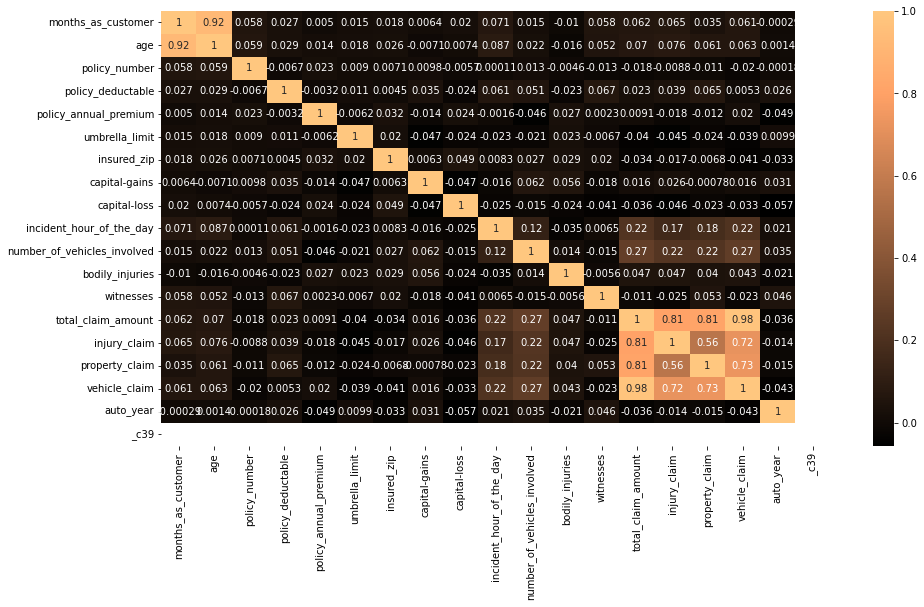

In [16]:
plt.figure(figsize=(15,8))
sns.heatmap(corr,annot=True,cmap='copper')
plt.show()

OBSERVATION

+ The high correlation between month_as_customer and age

In [17]:
df.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day 

# + Dropping columns
 
 there are columns in the dataset which is not required for analysis. so, by using the pandas' drop() function.

In [18]:
df.drop(['incident_location' , 'policy_bind_date','incident_date','auto_model','insured_occupation','policy_number','_c39'],axis=1, inplace=True)

# EDA and its concluding remark

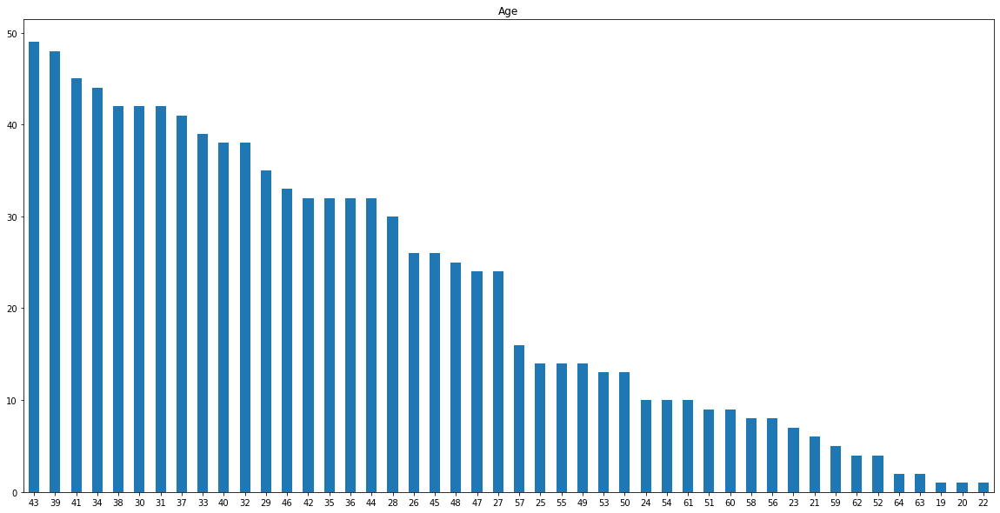

In [19]:
plt.subplot()
df['age'].value_counts().plot(kind='bar',title='Age',figsize=(20,10))
plt.xticks(rotation=0);

OBSERVATION:  
+ At the age of between 45yrs - 50yrs age are claiming insurance 

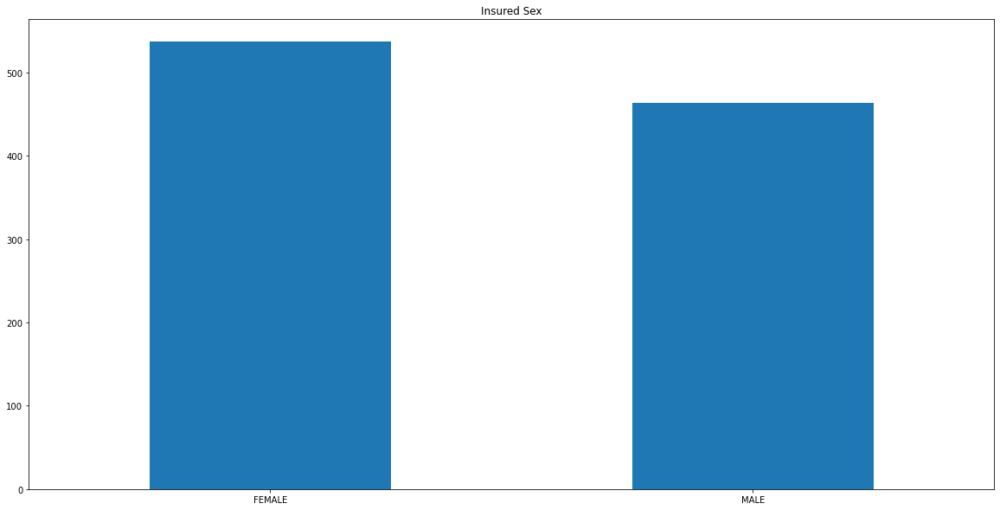

In [20]:
plt.subplot()
df['insured_sex'].value_counts().plot(kind='bar',title='Insured Sex',figsize=(20,10))
plt.xticks(rotation=0);

 the accuracy of female is higher than male are claiming insurance

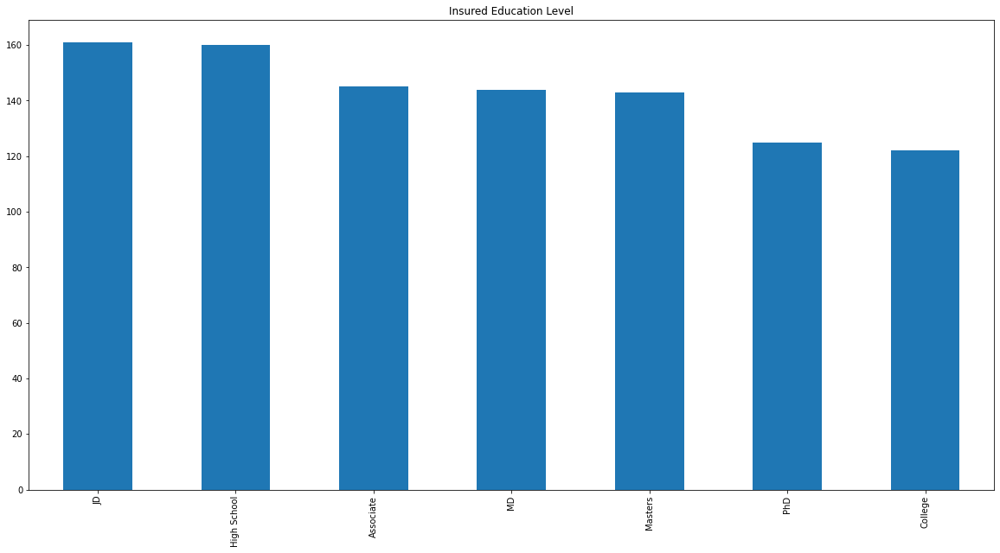

In [21]:
plt.subplot()
df['insured_education_level'].value_counts().plot(kind='bar',title='Insured Education Level', figsize=(20,10));

the JD and high school are in the competiton for the insured_education_level which both of them at higher position among all column

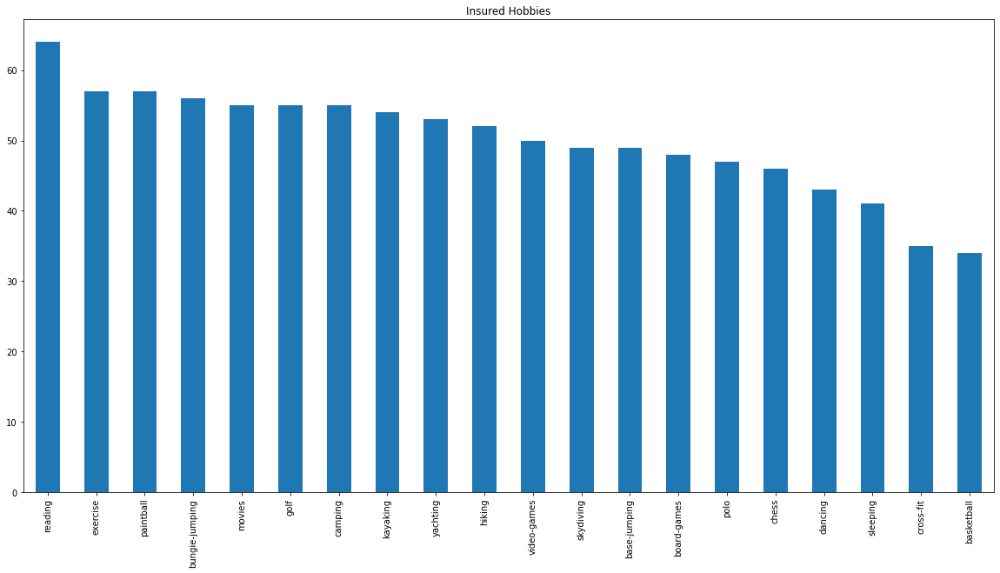

In [22]:
plt.subplot()
df['insured_hobbies'].value_counts().plot(kind='bar',title='Insured Hobbies',figsize=(20,10));

the accuracy of reading is higher than others insured hobbies

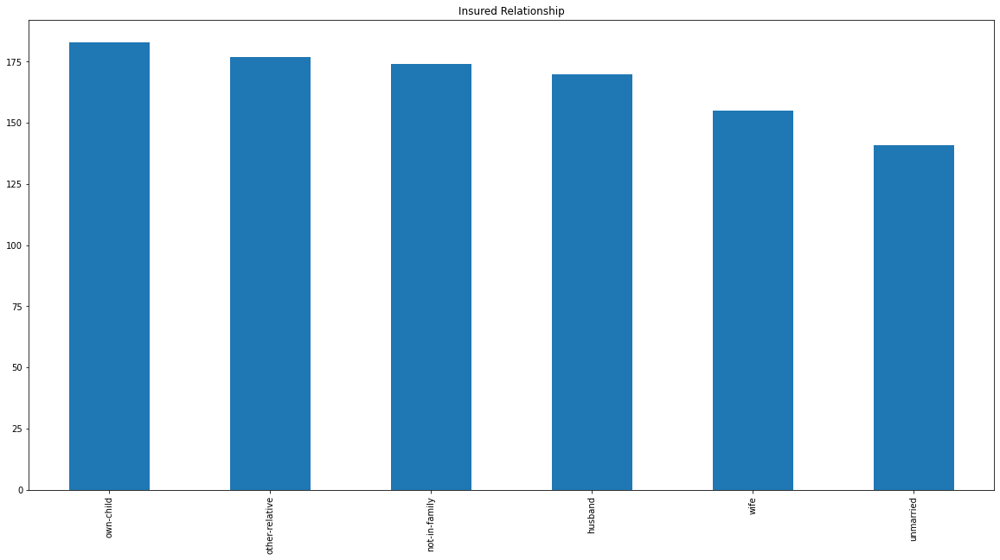

In [23]:
plt.subplot()
df['insured_relationship'].value_counts().plot(kind='bar',title='Insured Relationship',figsize=(20,10));

those who have their own-child are at high accuracy and they are in the insured relationship column 

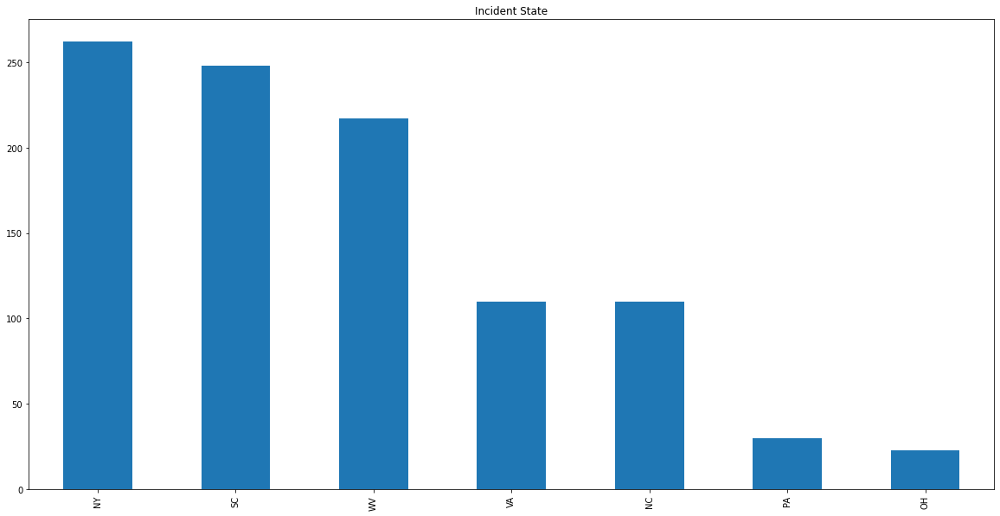

In [24]:
plt.subplot()
df['incident_state'].value_counts().plot(kind='bar',title='Incident State',figsize=(20,10));

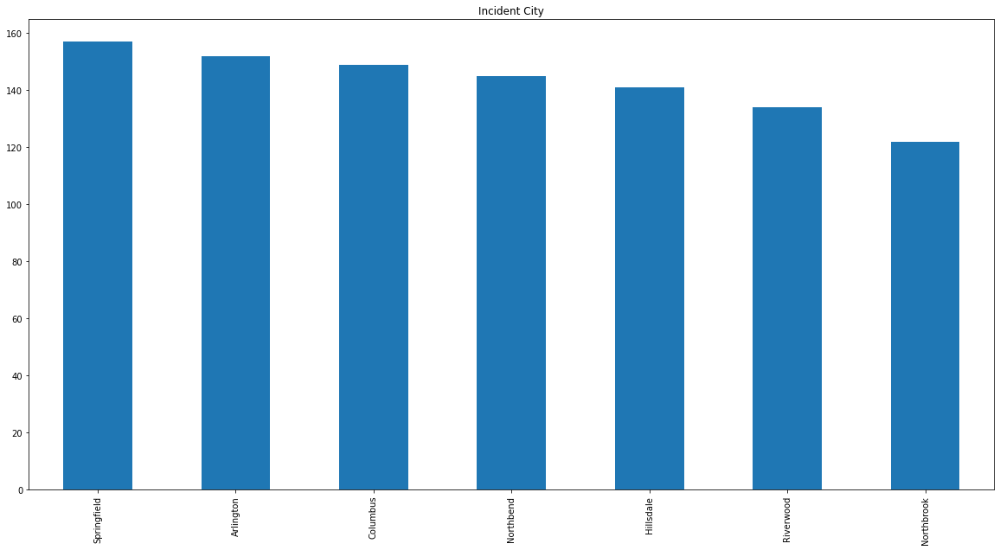

In [25]:
plt.subplot()
df['incident_city'].value_counts().plot(kind='bar',title='Incident City',figsize=(20,10));

the incident city are those city which face the problem of insurance fraud and the city is springfield with the accuarcy of 96.8%(155 out of 160)

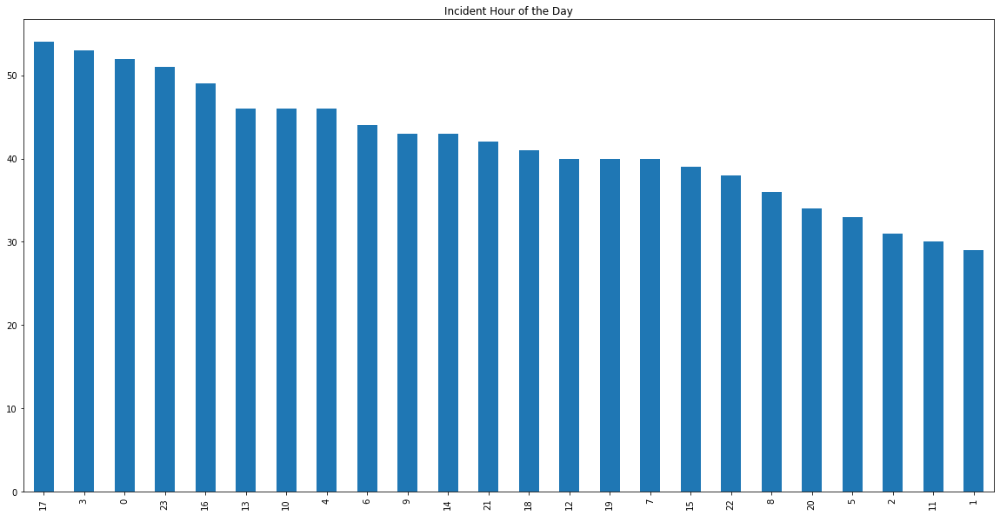

In [26]:
plt.subplot()
df['incident_hour_of_the_day'].value_counts().plot(kind='bar',title='Incident Hour of the Day',figsize=(20,10));

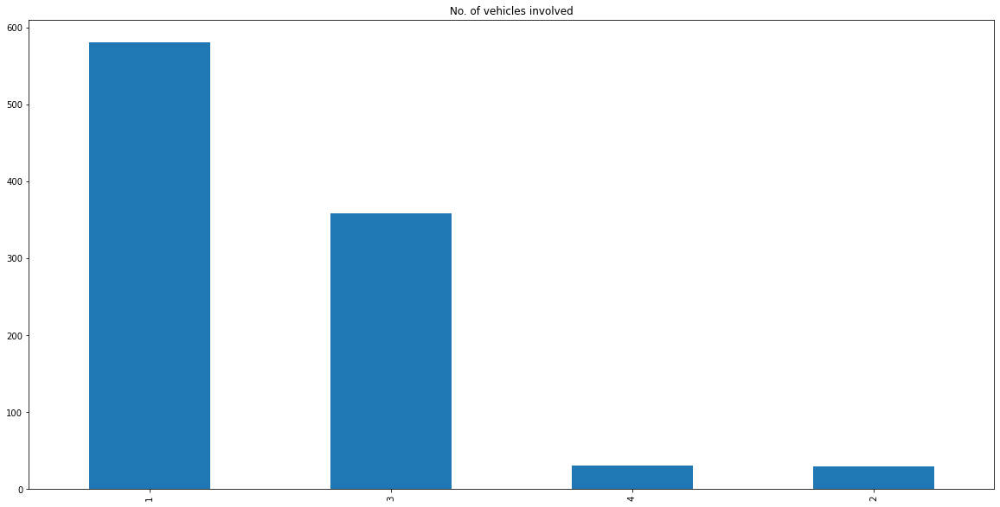

In [27]:
plt.subplot()
df['number_of_vehicles_involved'].value_counts().plot(kind='bar',title='No. of vehicles involved',figsize=(20,10));

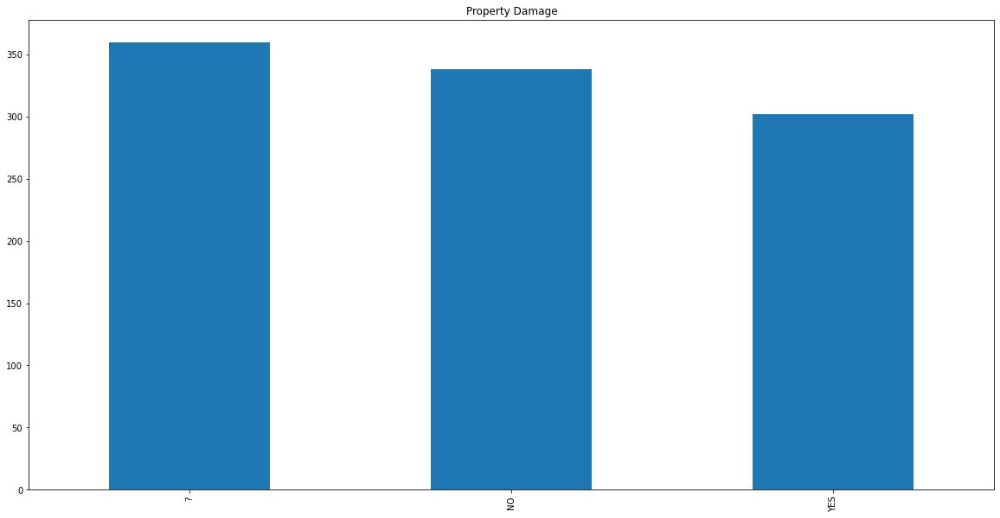

In [28]:
plt.subplot()
df['property_damage'].value_counts().plot(kind='bar',title='Property Damage',figsize=(20,10));

unknown property damage is at the high position with the accuracy 350 above claim insurance

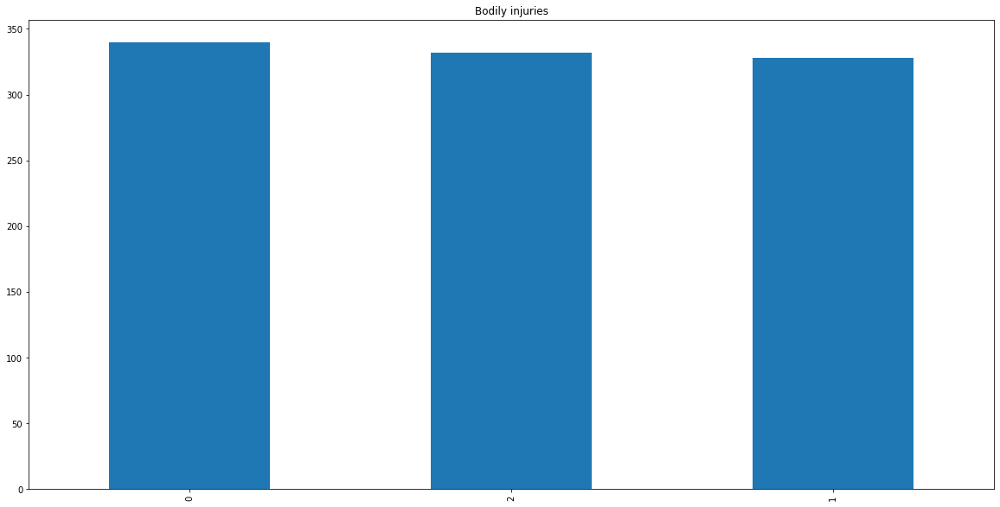

In [29]:
plt.subplot()
df['bodily_injuries'].value_counts().plot(kind='bar',title='Bodily injuries',figsize=(20,10));

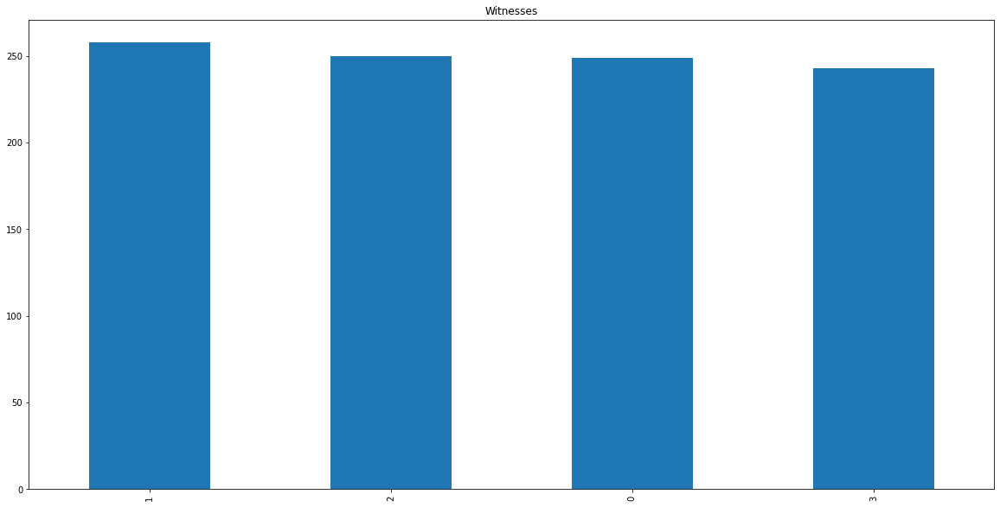

In [30]:
plt.subplot()
df['witnesses'].value_counts().plot(kind='bar',title='Witnesses',figsize=(20,10));

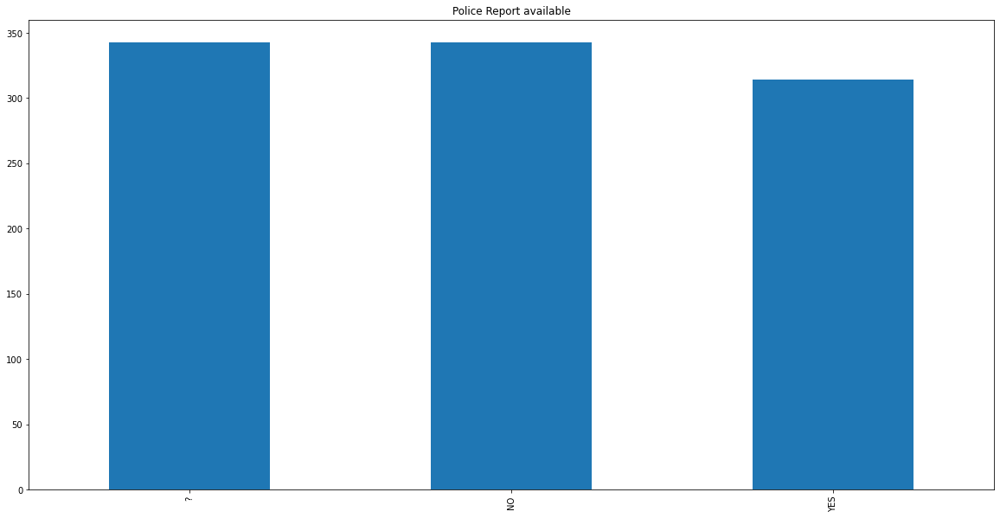

In [31]:
plt.subplot()
df['police_report_available'].value_counts().plot(kind='bar',title='Police Report available',figsize=(20,10));

unknown police report available is at high position with accuracy of 340 above claim insurance

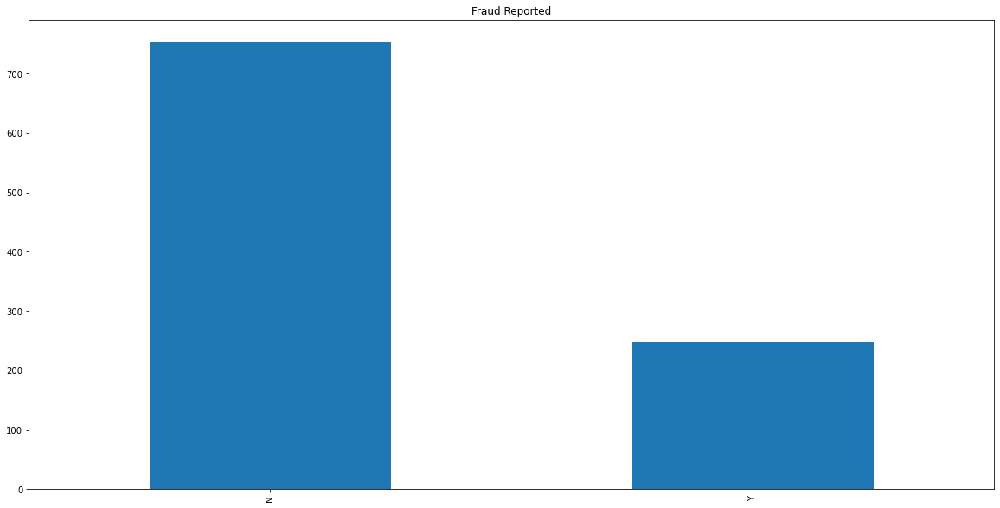

In [32]:
plt.subplot()
df['fraud_reported'].value_counts().plot(kind='bar',title='Fraud Reported',figsize=(20,10));

the number of fraud against the insurance claims are not reported are at higher position than the fraud against the insurance claims

<AxesSubplot:xlabel='capital-gains', ylabel='Density'>

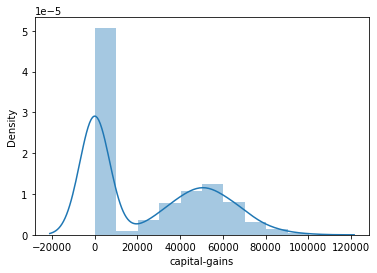

In [33]:
sns.distplot(df['capital-gains'])

Any profit arising on receipt of claim from Insurance company on account of damage or destruction of capital asset would be treated as Capital Gain of the year in which such claim is received. Here, the capital gains is only higher at between  0-2000 and the density is high at same position

<AxesSubplot:xlabel='capital-loss', ylabel='Density'>

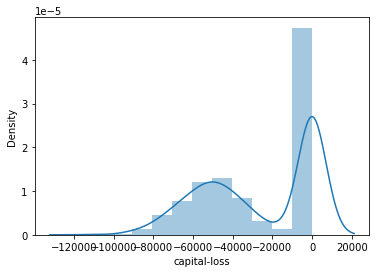

In [34]:
sns.distplot(df['capital-loss'])

when a security is sold for less than the purchase price—can be used to reduce the tax burden of future capital gains treated as capital loss. As seen above about the capital gain distribution plot the opposite goes with the capital loss 0-(-2000) here it goes in the direction of negative and there it goes in the direction of positive.

<AxesSubplot:xlabel='total_claim_amount', ylabel='Density'>

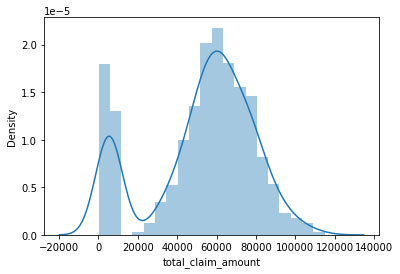

In [35]:
sns.distplot(df['total_claim_amount'])

<AxesSubplot:xlabel='property_claim', ylabel='Density'>

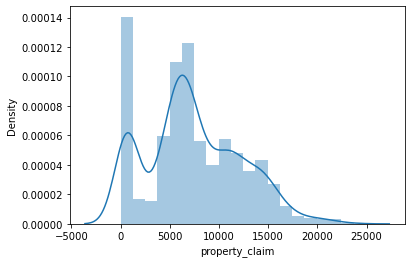

In [36]:
sns.distplot(df['property_claim'])

<AxesSubplot:xlabel='vehicle_claim', ylabel='Density'>

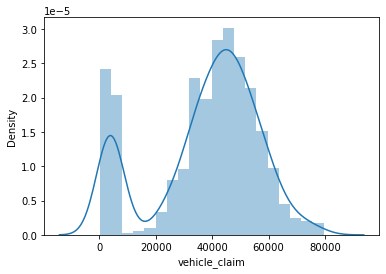

In [37]:
sns.distplot(df['vehicle_claim'])

<AxesSubplot:xlabel='auto_year', ylabel='Density'>

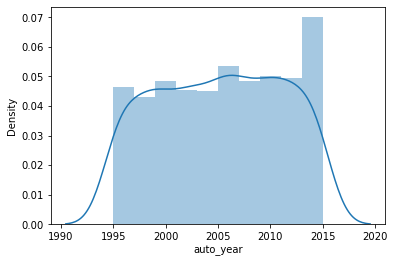

In [38]:
sns.distplot(df['auto_year'])

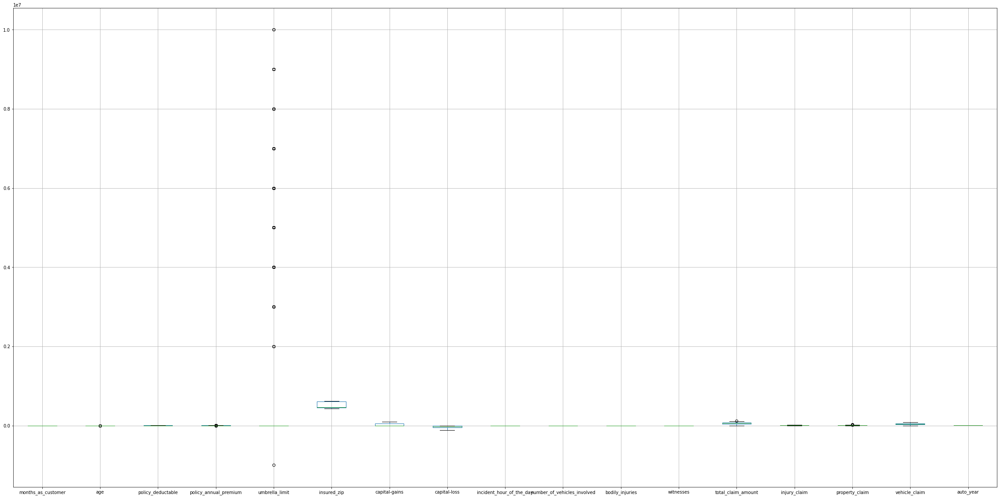

In [39]:
plt.figure(figsize=(40,20))
df.boxplot();

Boxplot shows the distribution of quantitative data in a way that facilitates comparisons between variables or across levels of a categorical variable. The box shows the quartiles of the dataset while the whiskers extend to show the rest of the distribution, except for points that are determined to be “outliers” using a method that is a function of the inter-quartile range.
+ The outliers are showing in two variables above they are age and umbrella_limit.

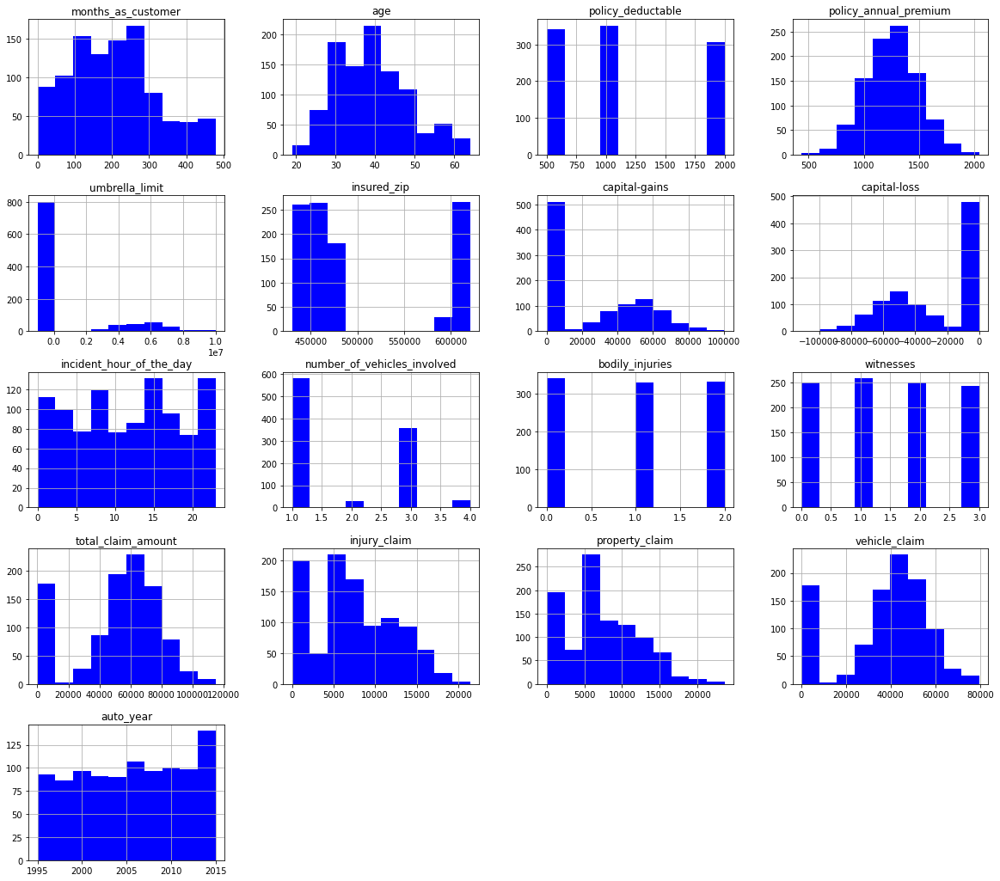

In [40]:
df.hist(color='b',figsize=(20,18))
plt.show()

the histogram is the optional parameter and it is used to draw histogram type parameter. Above all showing the histogram of variables.

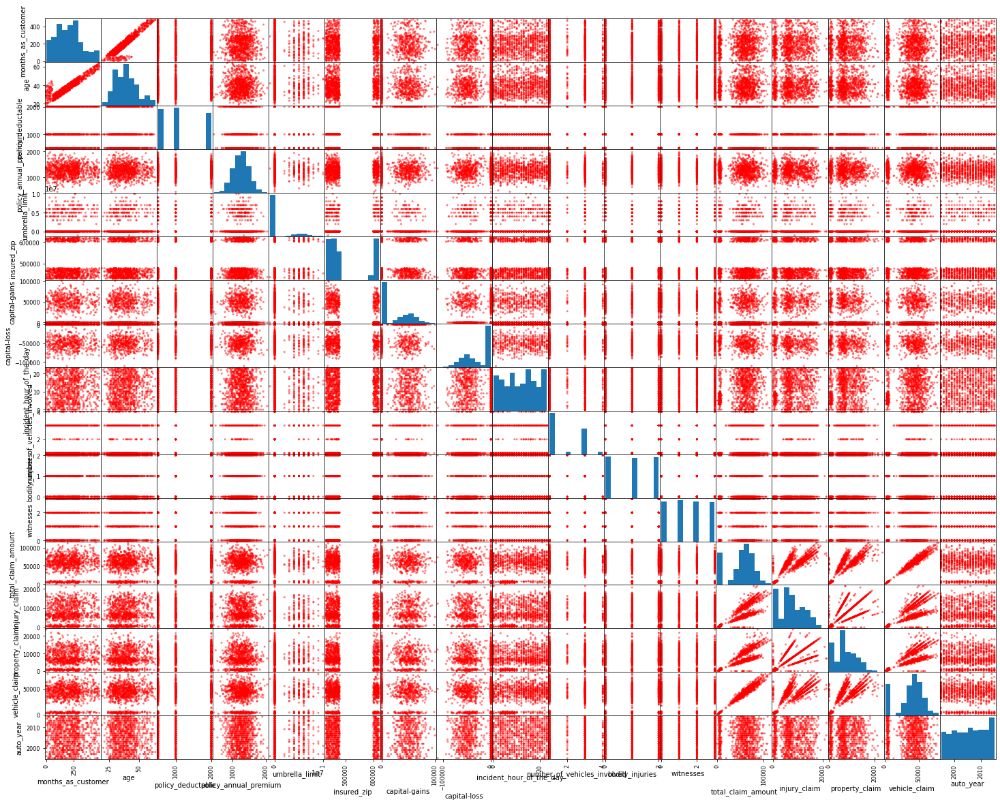

In [41]:
from pandas.plotting import scatter_matrix
scatter_matrix(df,figsize=(25,20),color='r');

scatterplots are just like pairplots there also the compactly plots all the numeric variables in a dataset against each other one and help to visualize the dataset

               capital-gains  capital-loss
capital-gains       1.000000     -0.046904
capital-loss       -0.046904      1.000000


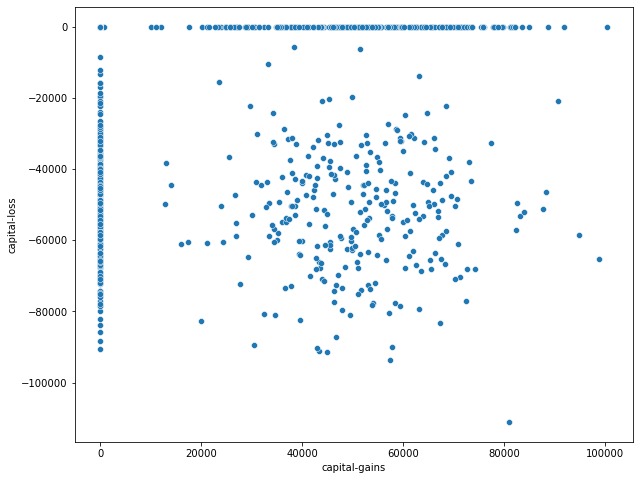

In [42]:
plt.figure(figsize=(10,8))
sns.scatterplot(df['capital-gains'],df['capital-loss'])
print(df[['capital-gains','capital-loss']].corr())
plt.show()

                capital-gains  capital-loss
                         
capital-gains       1.000000     -0.046904

capital-loss       -0.046904      1.000000
+ this showed the scatterplot of capital gains and loss

Empty DataFrame
Columns: []
Index: []


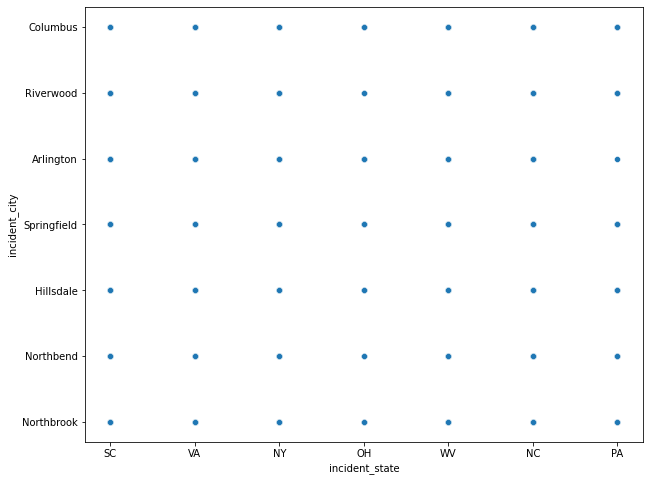

In [43]:
plt.figure(figsize=(10,8))
sns.scatterplot(df['incident_state'],df['incident_city'])
print(df[['incident_state','incident_city']].corr())
plt.show()

                 bodily_injuries  injury_claim
bodily_injuries         1.000000      0.047319
injury_claim            0.047319      1.000000


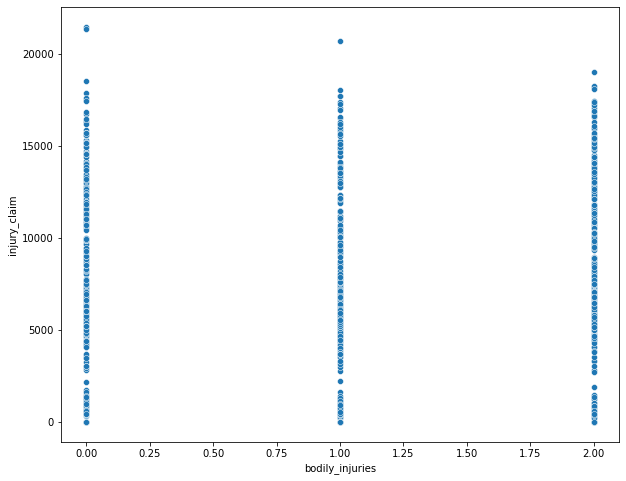

In [44]:
plt.figure(figsize=(10,8))
sns.scatterplot(df['bodily_injuries'],df['injury_claim'])
print(df[['bodily_injuries','injury_claim']].corr())
plt.show()

                 bodily_injuries  injury_claim
bodily_injuries         1.000000      0.047319

injury_claim            0.047319      1.000000
+ this showed scatterplot of bodily injuries and injury claim

                             number_of_vehicles_involved  vehicle_claim
number_of_vehicles_involved                     1.000000       0.269393
vehicle_claim                                   0.269393       1.000000


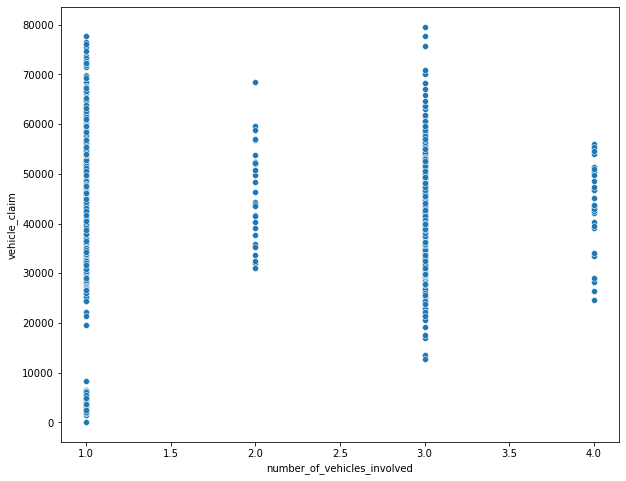

In [45]:
plt.figure(figsize=(10,8))
sns.scatterplot(df['number_of_vehicles_involved'],df['vehicle_claim'])
print(df[['number_of_vehicles_involved','vehicle_claim']].corr())
plt.show()

                         number_of_vehicles_involved  vehicle_claim
number_of_vehicles_involved                     1.000000       0.269393

vehicle_claim                                   0.269393       1.000000
+ this showed number of vehicles involved and vehicle claim against insurance fraud

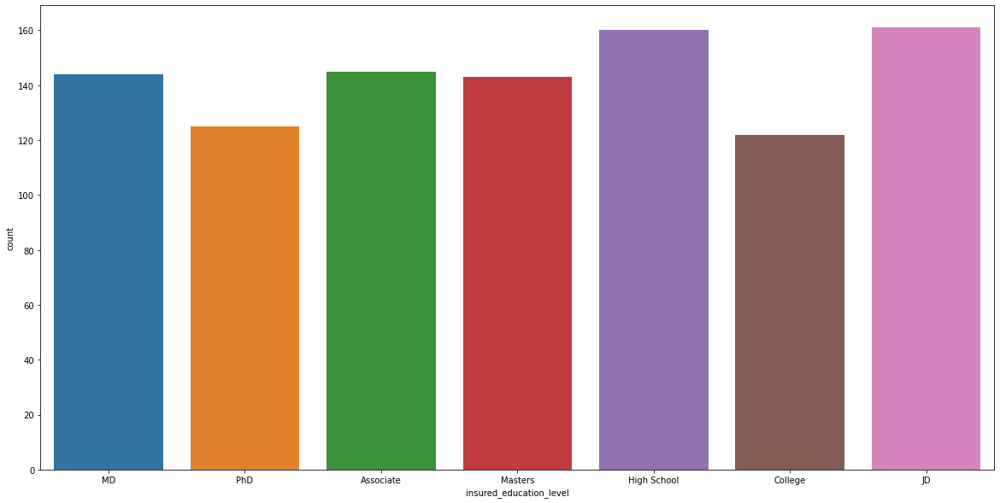

In [46]:
plt.figure(figsize=(20,10))
sns.countplot(df['insured_education_level'])
plt.show()

by using countplot, the high school and JD are at high position of the insured education level

<AxesSubplot:xlabel='fraud_reported', ylabel='count'>

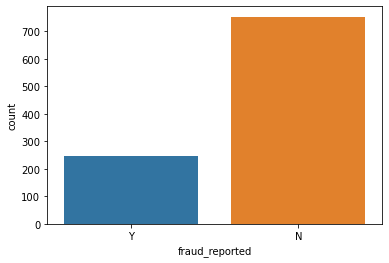

In [47]:
sns.countplot(df['fraud_reported'])

the number of no fraud report against the insurance claim higher than against the fraud report by using countplot.

<AxesSubplot:xlabel='police_report_available', ylabel='count'>

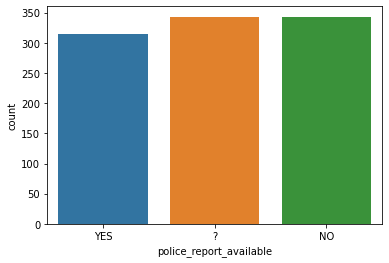

In [48]:
sns.countplot(df['police_report_available'])

the "unknown" and "no" police report available  against the insurance fraud  same position 

<AxesSubplot:xlabel='property_claim', ylabel='count'>

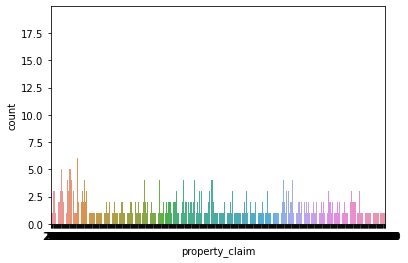

In [49]:
sns.countplot(df['property_claim'])

<AxesSubplot:xlabel='incident_state', ylabel='count'>

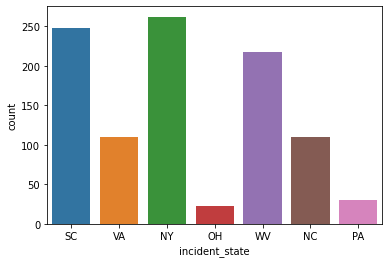

In [50]:
sns.countplot(df['incident_state'])

The NY (incident state) is at high position

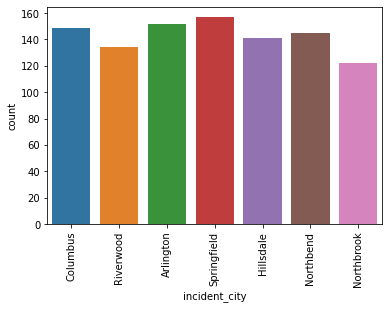

In [51]:
sns.countplot(df['incident_city'])
plt.xticks(rotation=90);

The springfield(incident city) is at high position

<AxesSubplot:xlabel='count', ylabel='property_damage'>

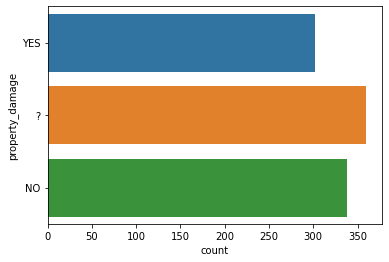

In [52]:
sns.countplot(y='property_damage',data=df)

the unknown property damage is at high position of about 350 above

<AxesSubplot:xlabel='count', ylabel='umbrella_limit'>

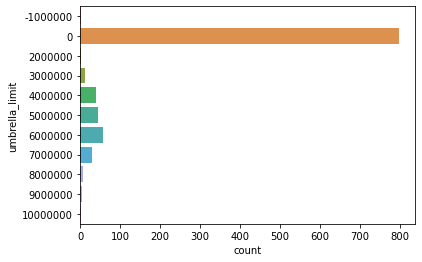

In [53]:
sns.countplot(y='umbrella_limit',data=df)

at the point of 0 the umbrella limit is higher than other having less accuracy

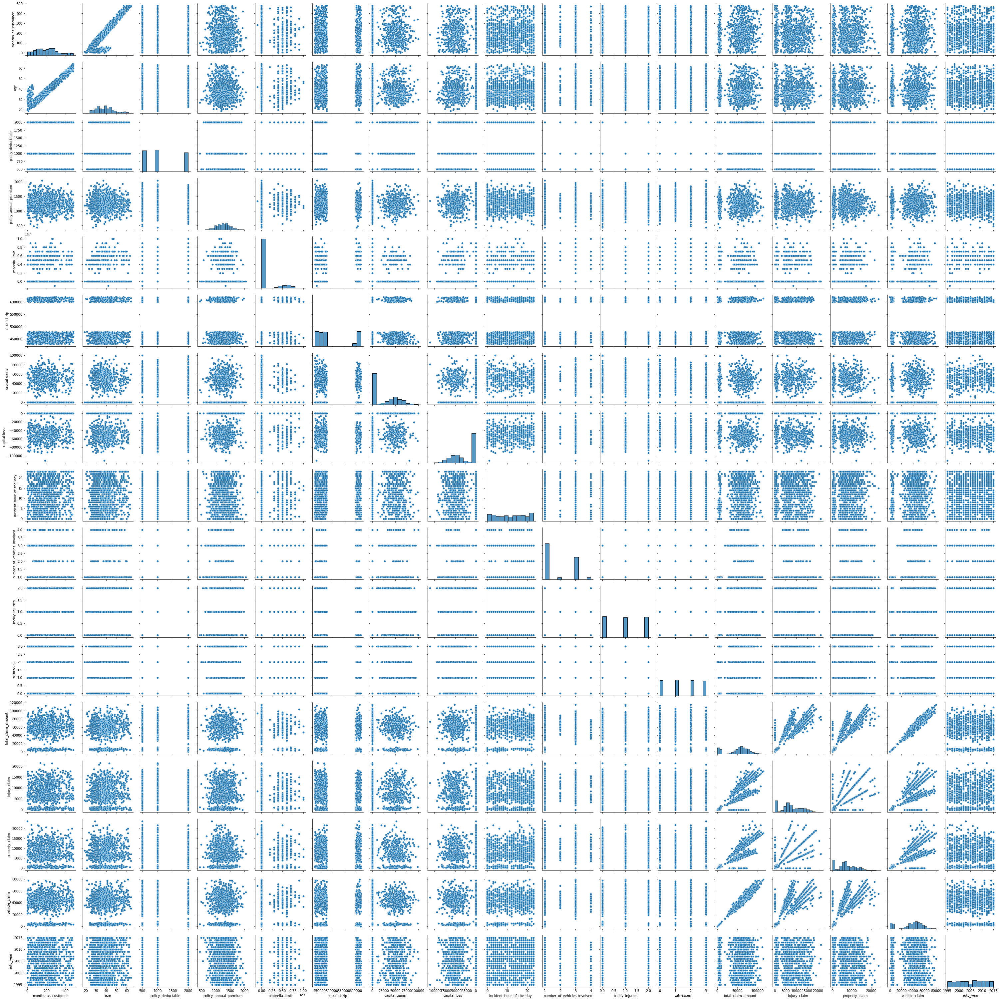

In [54]:
sns.pairplot(df)

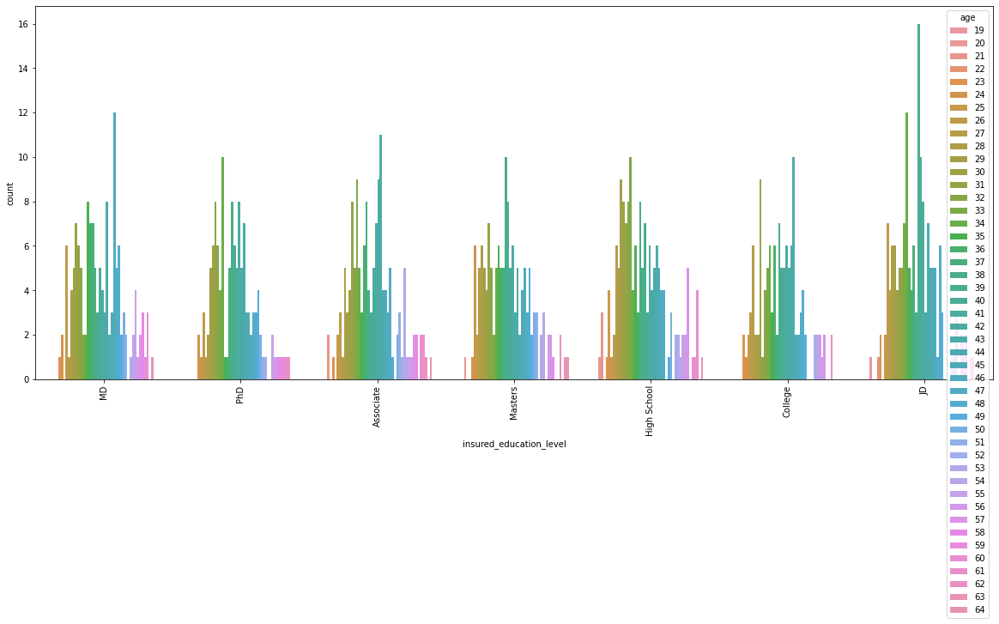

In [55]:
plt.figure(figsize=(20,8))
sns.countplot(x='insured_education_level', hue='age', data=df)
plt.xticks(rotation=90)
plt.show()

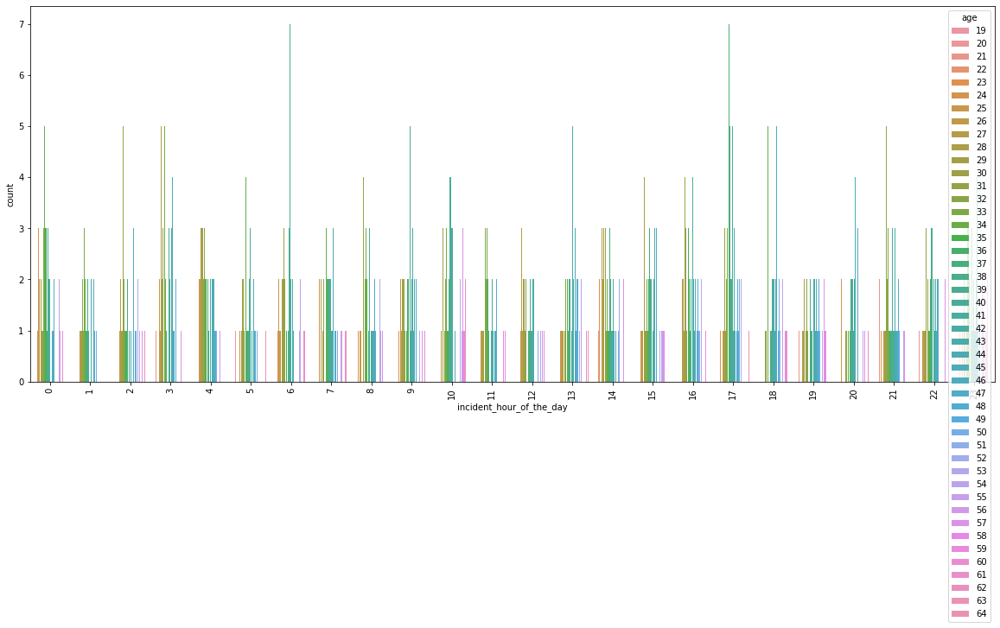

In [56]:
plt.figure(figsize=(20,8))
sns.countplot(x='incident_hour_of_the_day', hue='age', data=df)
plt.xticks(rotation=90)
plt.show()

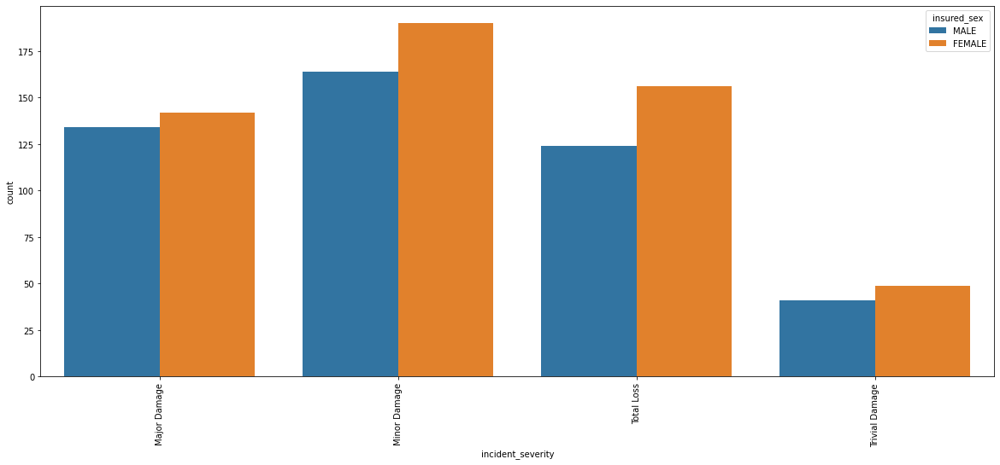

In [57]:
plt.figure(figsize=(20,8))
sns.countplot(x='incident_severity', hue='insured_sex', data=df)
plt.xticks(rotation=90)
plt.show()

minor damage(incident severity) is distributed among the insured sex male have less severity damage and female get the high 

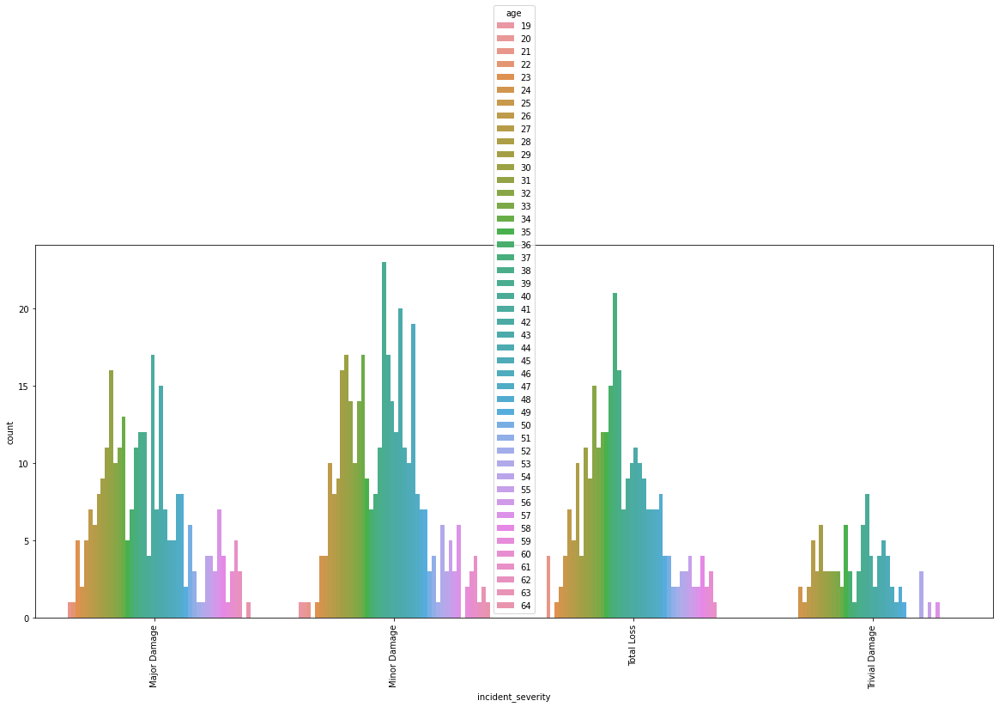

In [58]:
plt.figure(figsize=(20,8))
sns.countplot(x='incident_severity', hue='age', data=df)
plt.xticks(rotation=90)
plt.show()

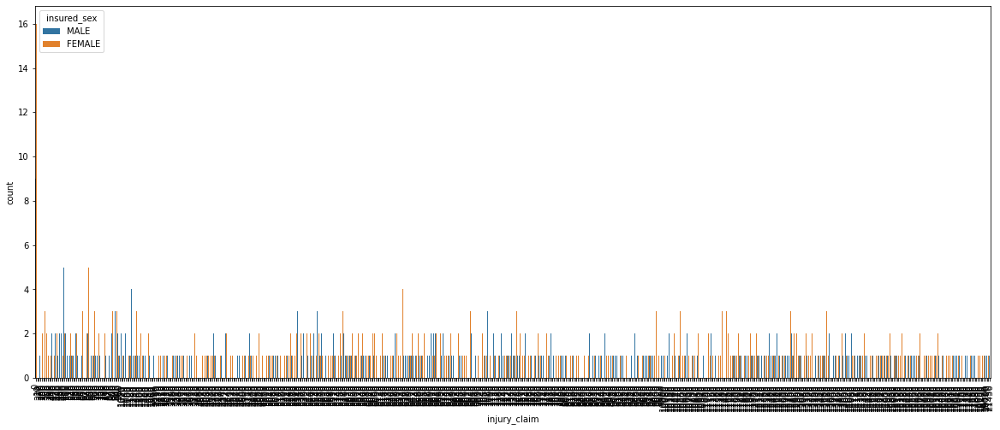

In [59]:
plt.figure(figsize=(20,8))
sns.countplot(x='injury_claim', hue='insured_sex', data=df)
plt.xticks(rotation=90)
plt.show()

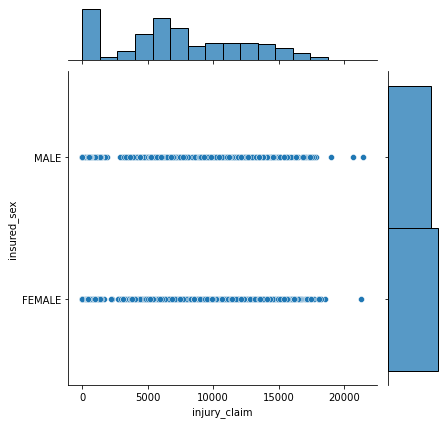

In [60]:
sns.jointplot(x='injury_claim',y='insured_sex',data=df)
plt.xticks(rotation=0)
plt.show()

jointplot draw a plot of two variables with bivariate and univariate graphs and shows the convenient interface to the JointGrid class and also the distribution of independent variables

<AxesSubplot:xlabel='injury_claim', ylabel='age'>

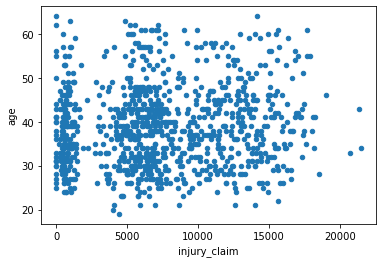

In [61]:
df[['injury_claim','age']].plot.scatter(x='injury_claim',y='age')

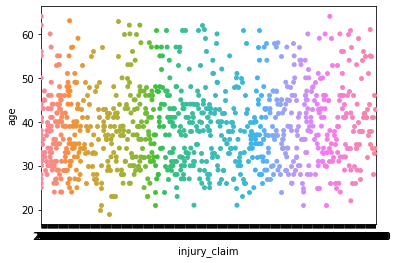

In [62]:
sns.stripplot(x='injury_claim' , y='age' , data=df)
plt.show()

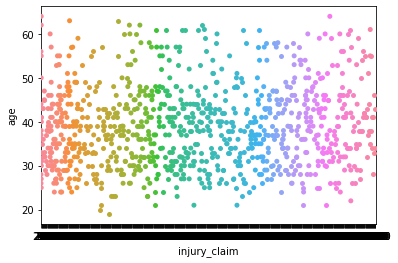

In [63]:
sns.swarmplot(x='injury_claim' , y='age' , data=df)
plt.show()

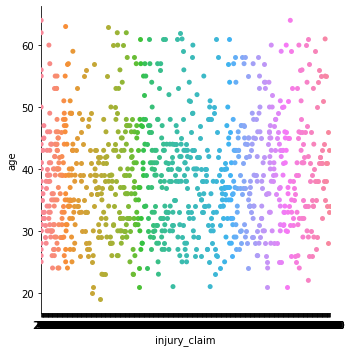

In [64]:
sns.catplot(x='injury_claim' , y='age' , data=df)
plt.show()

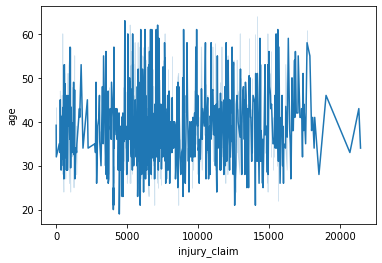

In [65]:
sns.lineplot(x='injury_claim' , y='age' , data=df)
plt.show()

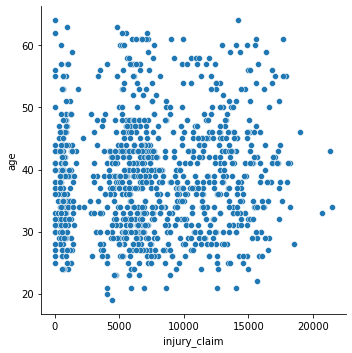

In [66]:
sns.relplot(x='injury_claim' , y='age' , data=df)
plt.show()

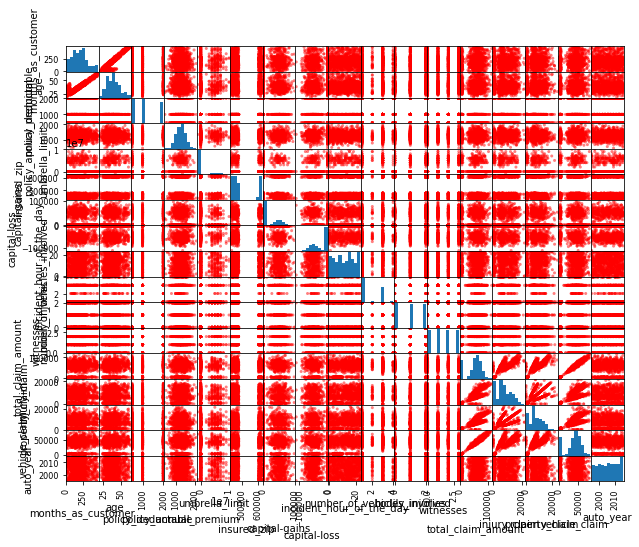

In [67]:
from pandas.plotting import scatter_matrix
scatter_matrix(df,figsize=(10,8),color='r')
plt.show()

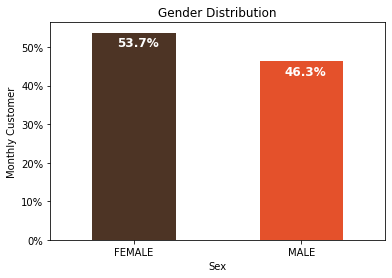

In [68]:
import matplotlib.ticker as mtick
colors = ['#4D3425','#E4512B']
ax = (df['insured_sex'].value_counts()*100.0 /len(df)).plot(kind='bar', stacked = True, rot = 0, color = colors)

ax.yaxis.set_major_formatter(mtick.PercentFormatter())
ax.set_ylabel('Monthly Customer')
ax.set_xlabel('Sex')
ax.set_title('Gender Distribution')

totals = [] # create a list to collect the plt.patches data

for i in ax.patches:
    totals.append(i.get_width())
total = sum(totals)
for i in ax.patches:
      ax.text(i.get_x()+.15, i.get_height()-3.5, \
            str(round((i.get_height()/total), 1))+'%', fontsize=12, color='white', weight = 'bold')


here, in the plot of gender distribution female has 53.7% and male has 46.3%

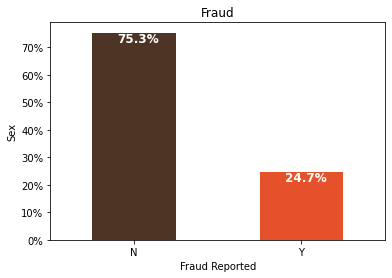

In [69]:
import matplotlib.ticker as mtick
colors = ['#4D3425','#E4512B']
ax = (df['fraud_reported'].value_counts()*100.0 /len(df)).plot(kind='bar', stacked = True, rot = 0, color = colors)

ax.yaxis.set_major_formatter(mtick.PercentFormatter())
ax.set_ylabel('Sex')
ax.set_xlabel('Fraud Reported')
ax.set_title('Fraud')

totals = [] # create a list to collect the plt.patches data

for i in ax.patches:
    totals.append(i.get_width())
total = sum(totals)
for i in ax.patches:
      ax.text(i.get_x()+.15, i.get_height()-3.5, \
            str(round((i.get_height()/total), 1))+'%', fontsize=12, color='white', weight = 'bold')


here in the fraud reported plot, the no. of no fraud reported has 75.3% against insurance claims and the no. of fraud reported where it has 24.7% 

Text(0.5, 1.0, 'Distributions of sex')

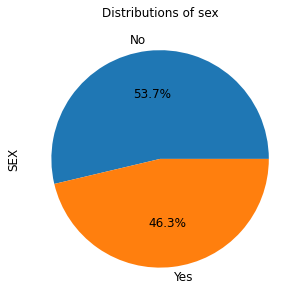

In [70]:
ax=(df['insured_sex'].value_counts()*100.0 /len(df))\
.plot.pie(autopct='%.1f%%', labels=['No' , 'Yes'], figsize= (5,5), fontsize=12 )
ax.yaxis.set_major_formatter(mtick.PercentFormatter())
ax.set_ylabel('SEX', fontsize=12)
ax.set_title('Distributions of sex', fontsize=12)

here, in the pie chart distribution of sex has female and male has the percentage of 53.7% and 46.3%

Text(0.5, 1.0, 'Distributions of Fraud')

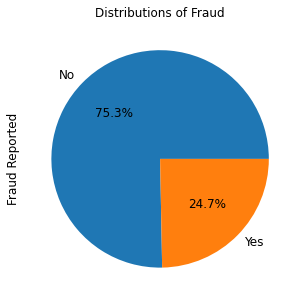

In [71]:
ax=(df['fraud_reported'].value_counts()*100.0 /len(df))\
.plot.pie(autopct='%.1f%%', labels=['No' , 'Yes'], figsize= (5,5), fontsize=12 )
ax.yaxis.set_major_formatter(mtick.PercentFormatter())
ax.set_ylabel('Fraud Reported', fontsize=12)
ax.set_title('Distributions of Fraud', fontsize=12)

here, in the pie chart distribution of fraud has 'no fraud against insurance' and 'fraud against insurance' has the percentage of 75.3% and 24.7%

Text(0.5, 1.0, 'Customers and their claim')

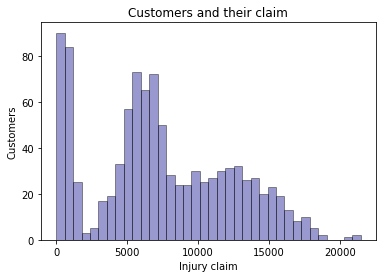

In [72]:
x=sns.distplot(df['injury_claim'], hist=True, kde=False, bins=int(180/5), color='darkblue',hist_kws={'edgecolor' : 'black' }, kde_kws={'linewidth':4})
x.set_ylabel('Customers')
x.set_xlabel('Injury claim')
x.set_title('Customers and their claim')

in this distribution plot, injury claim has higher accuracy at 0-5000  so, this is the customers and their claim towards insurance claim

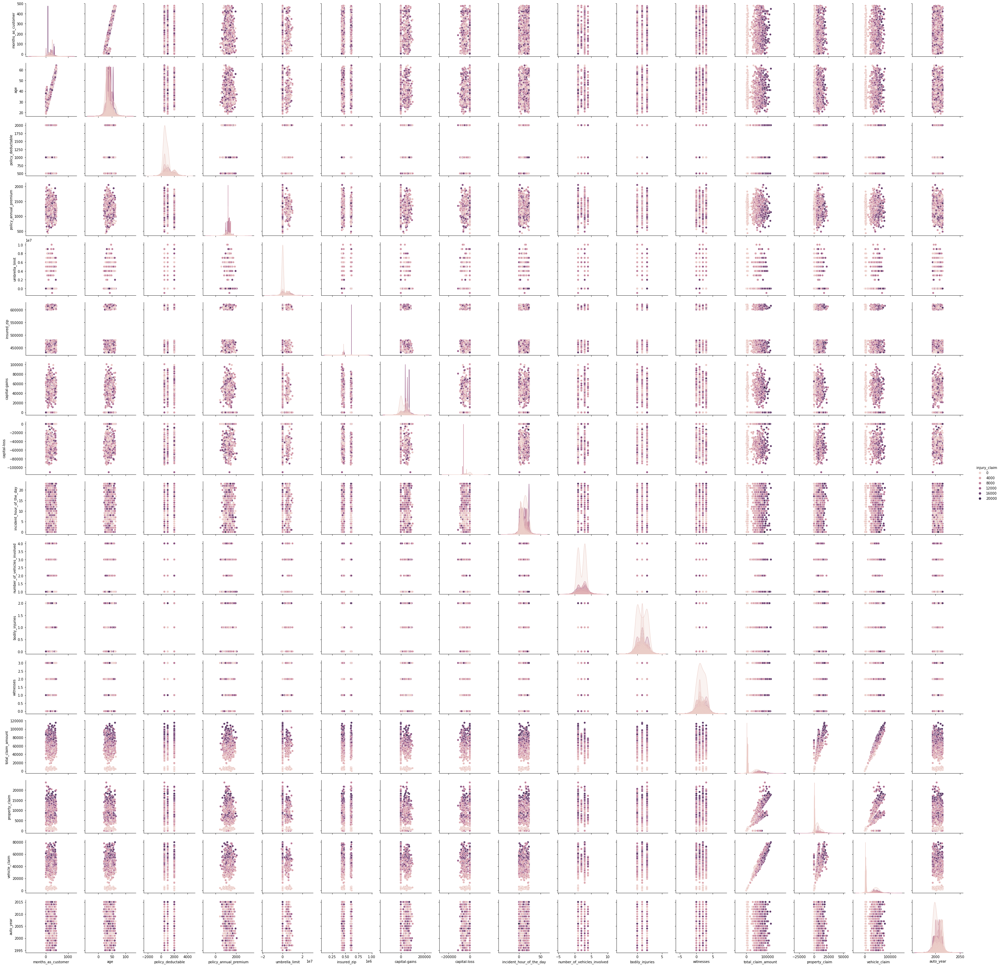

In [73]:
sns.pairplot(data=df,hue="injury_claim")

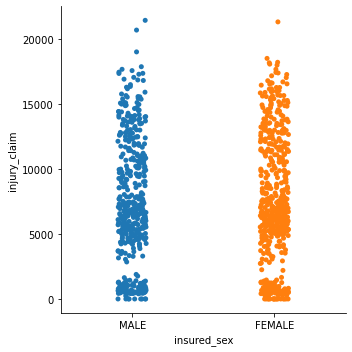

In [74]:
sns.catplot(x="insured_sex",y="injury_claim",data=df)

<AxesSubplot:xlabel='injury_claim', ylabel='insured_sex'>

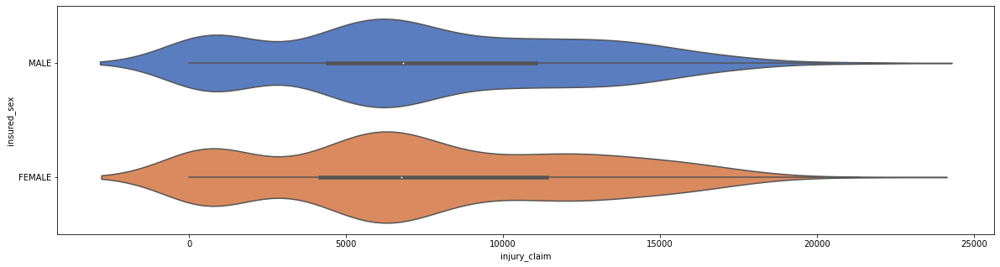

In [75]:
from matplotlib import pyplot
fig,ax=pyplot.subplots(figsize=(20,5))
ax=sns.violinplot(x="injury_claim",y="insured_sex",data=df,gridsize=100,palette="muted",split=True,saturation=0.75)
ax

# DATA PREPROCESSING

In [76]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
le_count=0
#Iterate through the columns
for col in df:
    if df[col].dtype == 'object':
        #If 2 or fewer unique categories
        if len(list(df[col].unique()))<=2:
            #Train on the training data
            le.fit(df[col])
            #Transform both training and testing data
            df[col]=le.transform(df[col])
            #keep track of how many columns were label encoded 
            le_count += 1
print('%d column were label encoded. ' % le_count)            

2 column were label encoded. 


<AxesSubplot:>

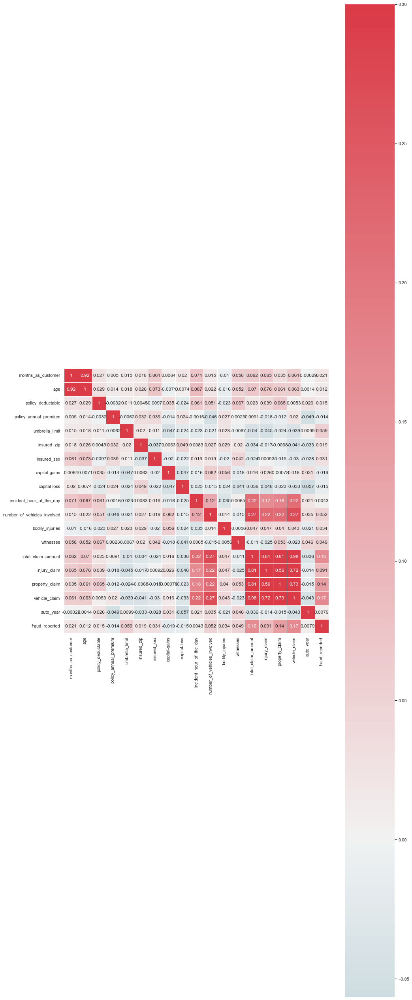

In [77]:
# df =pd.get_dummies(df)
#print('Training Features Shape: ', df.shape)
sns.set(style="white")
#set up the matplotlib figure 
f, ax = plt.subplots(figsize=(15,15))
#Generate a custom diverging colormap
cmap=sns.diverging_palette(220,10,as_cmap=True)
sns.heatmap(df.corr(),cmap=cmap,vmax=.3,center=0,annot=True, square=True,linewidths=.5,cbar_kws={"shrink":5})

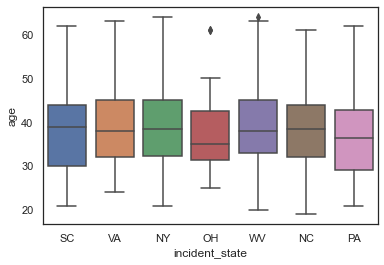

In [78]:
sns.boxplot(x='incident_state',y='age',data=df)
plt.show()

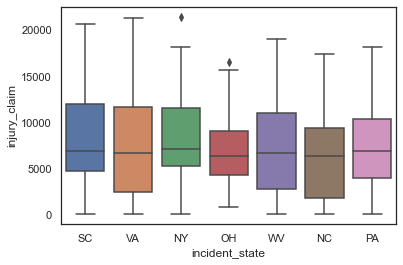

In [79]:
sns.boxplot(x='incident_state',y='injury_claim',data=df)
plt.show()

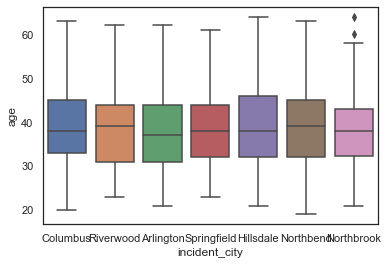

In [80]:
sns.boxplot(x='incident_city',y='age',data=df)
plt.show()

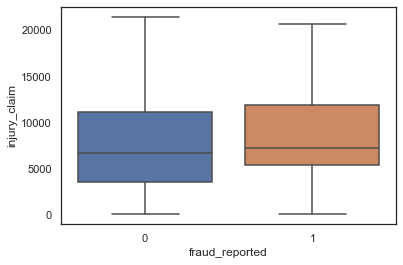

In [81]:
sns.boxplot(x='fraud_reported',y='injury_claim',data=df)
plt.show()

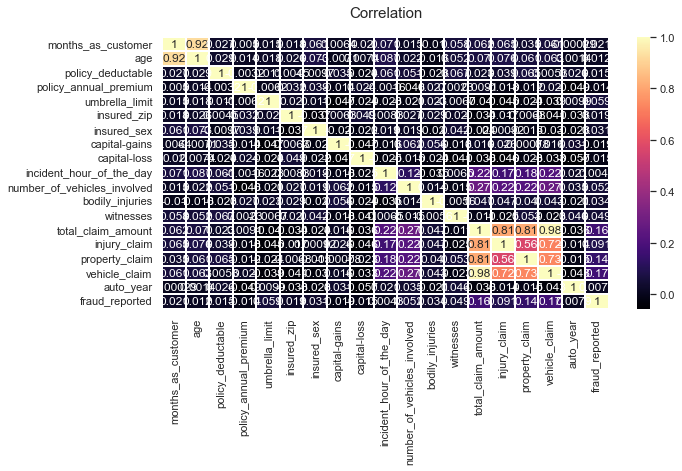

In [82]:
def correlation_heatmap(df):
    ax=plt.subplots(figsize=(10,5))
    colormap=sns.diverging_palette(220, 10, as_cmap = True)
    ax=sns.heatmap(df.corr(),cmap="magma",annot=True,linewidths=0.1,vmax=1.0,linecolor='white',annot_kws={'fontsize':12})
    plt.title('Correlation',y=1.05,size=15)

correlation_heatmap(df)

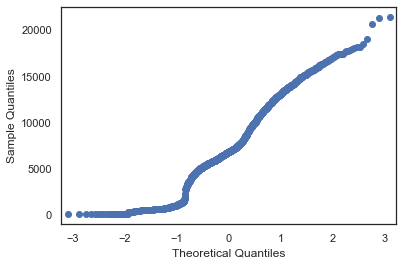

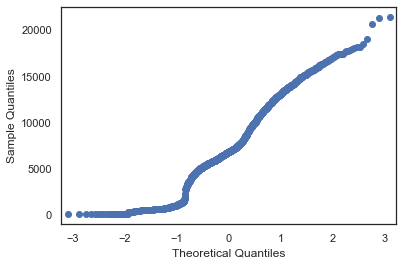

In [83]:
from statsmodels.graphics.gofplots import qqplot
def qq_plots(df):
    plt.figure(figsize=(10,4))
    qqplot(df,line='s')
    plt.title("NormalQQPlot")
    plt.show()
qqplot(df['injury_claim'])

In [84]:
column_name=[]
unique_value=[]
#iterate through the columns
for col in df:
    if df[col].dtype == 'object':
        #if 2 or fewr unique categories
        column_name.append(str(col))
        unique_value.append(df[col].nunique())

tab=pd.DataFrame()
tab['Col_name'] = column_name
tab['Value']=unique_value
tab=tab.sort_values('Value', ascending=False)
tab

,Col_name,Value
3,insured_hobbies,20
13,auto_make,14
2,insured_education_level,7
9,incident_state,7
10,incident_city,7
4,insured_relationship,6
8,authorities_contacted,5
5,incident_type,4
6,collision_type,4
7,incident_severity,4


<AxesSubplot:xlabel='insured_hobbies', ylabel='count'>

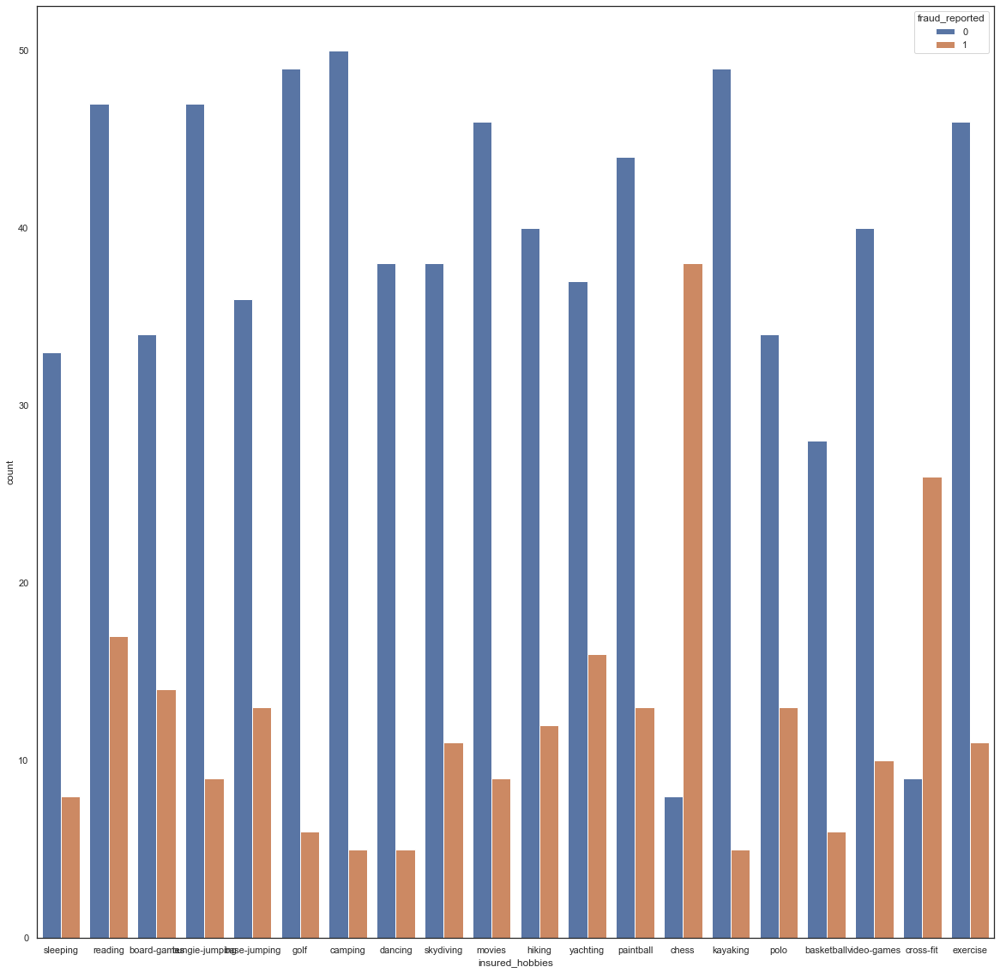

In [85]:
f, ax=plt.subplots(figsize=(20,20))
sns.countplot(x='insured_hobbies',hue='fraud_reported',data=df)

In [86]:
#create additional 'other' column f insures hobbies are not chess and cross fit
df['insured_hobbies']=df['insured_hobbies'].apply(lambda x : 'Other' if x!='chess' and x!='cross-fit' else x)

<AxesSubplot:xlabel='auto_make', ylabel='count'>

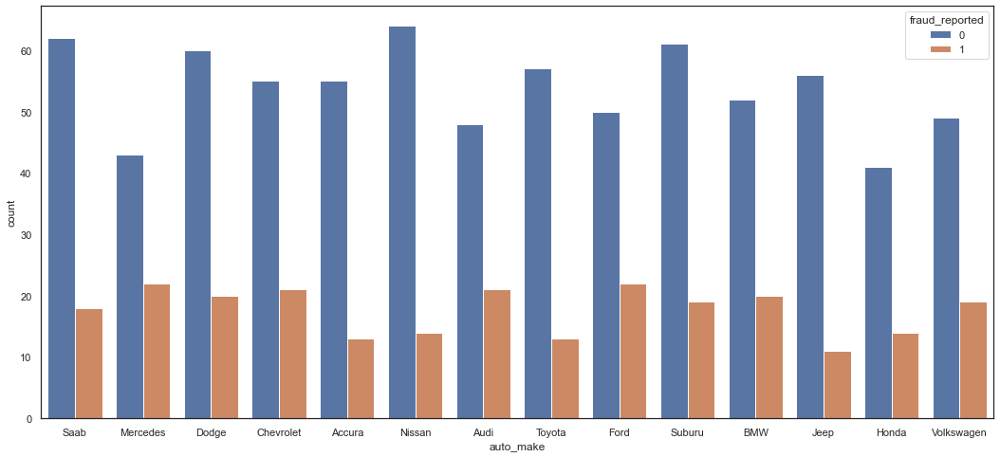

In [87]:
f,ax = plt.subplots(figsize=(18,8))
sns.countplot(x='auto_make',hue='fraud_reported',data=df)

In [88]:
df['insured_hobbies'].unique()

array(['Other', 'chess', 'cross-fit'], dtype=object)

In [89]:
df=pd.get_dummies(df)
print('Training Features shape: ',df.shape)

Training Features shape:  (1000, 92)


<AxesSubplot:xlabel='fraud_reported', ylabel='count'>

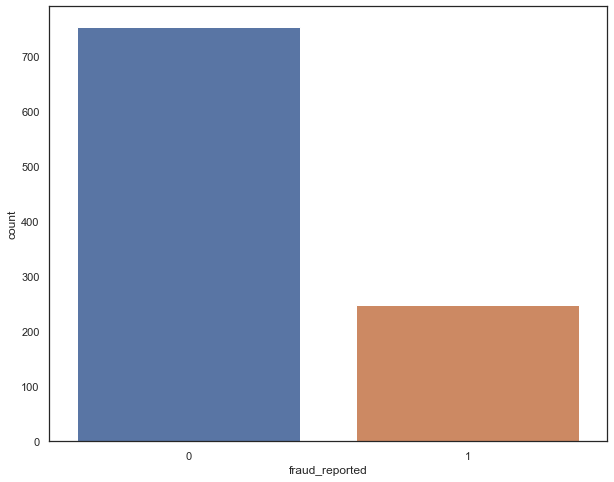

In [90]:
plt.subplots(figsize=(10,8))
sns.countplot(x='fraud_reported',data=df)

# BUILDING MACHINE LEARNING MODELS

In [91]:
df.isnull().sum()

months_as_customer       0
age                      0
policy_deductable        0
policy_annual_premium    0
umbrella_limit           0
                        ..
auto_make_Nissan         0
auto_make_Saab           0
auto_make_Suburu         0
auto_make_Toyota         0
auto_make_Volkswagen     0
Length: 92, dtype: int64

In [92]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 92 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   months_as_customer                      1000 non-null   int64  
 1   age                                     1000 non-null   int64  
 2   policy_deductable                       1000 non-null   int64  
 3   policy_annual_premium                   1000 non-null   float64
 4   umbrella_limit                          1000 non-null   int64  
 5   insured_zip                             1000 non-null   int64  
 6   insured_sex                             1000 non-null   int32  
 7   capital-gains                           1000 non-null   int64  
 8   capital-loss                            1000 non-null   int64  
 9   incident_hour_of_the_day                1000 non-null   int64  
 10  number_of_vehicles_involved             1000 non-null   int64

In [93]:
X_train=df['injury_claim']
X_test=df['insured_sex']
y=df.age

In [94]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
scaler=StandardScaler()
X_train=X_train.values.reshape(-1,1)
X_test = X_test.values.reshape(-1,1)
X_train, X_test, y_train, y_test = train_test_split(X_train, y, test_size=0.3,random_state=42)

In [95]:
from sklearn.ensemble import GradientBoostingClassifier

gbdt_clf = GradientBoostingClassifier()
gbdt_clf.fit(X_train, y_train)
pred = gbdt_clf.predict(X_train)

gbdt_clf_report = pd.DataFrame(classification_report(y_train,pred,output_dict=True))

print("\n====================Train Result=====================")

print("Accuracy Score: ",accuracy_score(y_train,pred)*100 )

print("__________________________________________________")
print(f"CLASSIFICATION REPORT : \n{gbdt_clf_report}")
print("___________________________________________________")
print(f"Cofusion Matrix:  \n {confusion_matrix(y_train, pred)}\n")

#****************************Test score********************************

pred = gbdt_clf.predict(X_test)
clf_report = pd.DataFrame(classification_report(y_test, pred, output_dict=True))

print("\n==================Test Result==========================")
print("Accuracy: ", accuracy_score(y_test,pred) * 100)
print("_____________________________________________")
print(f"CLASSIFICATION REPORT :\n{clf_report}")
print("______________________________________________")
print(f"Confusion Matrix: \n {confusion_matrix(y_test, pred)}\n")



====================Train Result=====================
Accuracy Score:  73.0
__________________________________________________
CLASSIFICATION REPORT : 
            19   20        21   22   23        24        25         26  \
precision  1.0  1.0  0.750000  0.0  1.0  0.571429  0.727273   0.722222   
recall     1.0  1.0  1.000000  0.0  1.0  1.000000  0.888889   0.722222   
f1-score   1.0  1.0  0.857143  0.0  1.0  0.727273  0.800000   0.722222   
support    1.0  1.0  3.000000  1.0  3.0  4.000000  9.000000  18.000000   

                  27         28  ...        58    59        60        61  \
precision   0.722222   0.937500  ...  0.857143  0.75  0.583333  0.900000   
recall      0.928571   0.714286  ...  1.000000  0.75  0.875000  1.000000   
f1-score    0.812500   0.810811  ...  0.923077  0.75  0.700000  0.947368   
support    14.000000  21.000000  ...  6.000000  4.00  8.000000  9.000000   

                 62   63   64  accuracy   macro avg  weighted avg  
precision  0.500000  1.0  0

HYPERPARAMETER TUNING

In [96]:
from sklearn.model_selection import GridSearchCV
grid_param = {
      'max_depth' : range(4,8),
      'min_sample_split' : range(2,8,2),
      'learning_rate' : np.arange(0.1,0.3)
}

In [97]:
randomforest = RandomForestClassifier()
randomforest.fit(X_train, y_train)
#y_pred=randomforest.predict(X_test)
score_randomforest = randomforest.score(X_test, y_test)
print('The accuracy of the Random Forest Model is ', score_randomforest)

The accuracy of the Random Forest Model is  0.03


In [98]:
knn=KNeighborsClassifier()
knn.fit(X_train, y_train)
#y_pred=knn.predict(X_test)
score_knn=knn.score(X_test,y_test)
print('The accuracy of the KNN Model is' , score_knn)

The accuracy of the KNN Model is 0.043333333333333335


In [99]:
from sklearn.svm import SVC
svc = SVC(gamma=0.22)
svc.fit(X_train, y_train)
#y_pred=logreg.predict(X_test)
score_svc=svc.score(X_test, y_test)
print('The accuarcy of SVC is', score_svc)

The accuarcy of SVC is 0.03333333333333333


In [100]:
logreg = LogisticRegression()
logreg.fit(X_train, y_train)
#y_pred=logreg.predict(X_test)
score_logreg = logreg.score(X_test,y_test)
print('The accuracy of the LogisticRegression is', score_logreg)

The accuracy of the LogisticRegression is 0.04


In [101]:
print ('The accuracy of the Random Forest Model is  0.03')
print('The accuracy of the KNN Model is 0.043333333333333335')
print('The accuarcy of SVC is 0.03333333333333333')
print('The accuracy of the LogisticRegression is 0.04')

The accuracy of the Random Forest Model is  0.03
The accuracy of the KNN Model is 0.043333333333333335
The accuarcy of SVC is 0.03333333333333333
The accuracy of the LogisticRegression is 0.04


# CONCLUDING REMARKS

From above, the insurance fraud is a huge problem in the industry. It's geting difficult to identify fraud claims.From using the machine learning is in a unique position to help the Auto Insurance industry with this problem. 

I choose this evaluation project because of many reasons that we the people in surrounding  faced the fraud against insurance and then we come for the insurance claims it goes with many proceeding. As a data scientist, wehave to make or work with some auto insurance data to demonstrate how we can create a predictive model that predicts if an insurance claim is fraudulent or not.

+ At the age of between 45yrs - 50yrs age are claiming insurance


+ the accuracy of female is higher than male are claiming insurance


+ the JD and high school are in the competiton for the insured_education_level which both of them at higher position among all column


+ the accuracy of reading is higher than others insured hobbies


+ those who have their own-child are at high accuracy and they are in the insured relationship column


+ the incident city are those city which face the problem of insurance fraud and the city is springfield with the accuarcy of 96.8%(155 out of 160).


+ unknown property damage is at the high position with the accuracy 350 above claim insurance


+ unknown police report available is at high position with accuracy of 340 above claim insurance


+ the number of fraud against the insurance claims are not reported are at higher position than the fraud against the insurance claims


+ Any profit arising on receipt of claim from Insurance company on account of damage or destruction of capital asset would be treated as Capital Gain of the year in which such claim is received. Here, the capital gains is only higher at between 0-2000 and the density is high at same position


+ when a security is sold for less than the purchase price—can be used to reduce the tax burden of future capital gains treated as capital loss. As seen above about the capital gain distribution plot the opposite goes with the capital loss 0-(-2000) here it goes in the direction of negative and there it goes in the direction of positive.


+ Boxplot shows the distribution of quantitative data in a way that facilitates comparisons between variables or across levels of a categorical variable. The box shows the quartiles of the dataset while the whiskers extend to show the rest of the distribution, except for points that are determined to be “outliers” using a method that is a function of the inter-quartile range.


+ The outliers are showing in two variables above they are age and umbrella_limit.
   the histogram is the optional parameter and it is used to draw histogram type      parameter. Above all showing the histogram of variables.
   
   
   
+ FINAL PREDICTION (in terms of %)


here, insurance fraud case the accuracy score was 85%.


train result  :  Accuracy Score:  73.0

test result  :   Accuracy:  2.666666666666667

# THANK YOU